In [28]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import tempfile
import subprocess
from tqdm import tqdm
import os
import subprocess
import re


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
!ls

chm13v2.0-g4hunter.merged.bed		   human.t2t.inverted.gz
chromosome_lengths_primates.txt		   primates
consensus_motifs			   TandemTelomeres.ipynb
g4_human_merged_mapped_chromosomes.bed	   TelomeresAnalysis.ipynb
g4_human_merged_mapped_chromosomes.bed.gz  TelomeresBinsG4.ipynb
homo_sapiens_consensus_g4		   Telomeres.ipynb
human.t2t.inverted


In [30]:
!ls consensus_motifs

chm13v2.0.consensus.csv
mGorGor1.pri.cur.20231122.consensus.csv
mPanPan1.pri.cur.20231122.consensus.csv
mPanTro3.pri.cur.20231122.consensus.csv
mPonAbe1.pri.cur.20231205.consensus.csv
mPonPyg2.pri.cur.20231122.consensus.csv
mSymSyn1.pri.cur.20231205.consensus.csv


# Part I: Human Analysis

We load the human centromeres & telomeres.

In [20]:
path = "consensus_motifs"
path

'consensus_motifs'

In [6]:
human_telomere = pd.read_csv("primates/telomeres/chm13v2.0_telomere.bed",
                            delimiter="\t",
                            header=None,
                            names=["chromosome", "start", "end"],
                    )\
                    .assign(compartment="telomere")

human_centromere = pd.read_csv("primates/centromeres/chm13v2.0_censat_v2.0.bed", 
                               delimiter="\t", 
                               skiprows=1, 
                               header=None,
                               usecols=[0, 1, 2, 3],
                               names=['chromosome', 'start', 'end', 'compartment']
                        )
human_centromere

,chromosome,start,end,compartment
0,chr1,116796047,121405145,ct_1_1(p_arm)
1,chr1,121405145,121406286,censat_1_1(rnd-6_family-4384)
2,chr1,121406286,121619169,ct_1_2
3,chr1,121619169,121625213,"hor_1_1(S3C1H2-A,B,C)"
4,chr1,121625213,121667941,"hor_1_2(S3C1H2-A,B)"
...,...,...,...,...
2518,chrY,62025776,62037362,censat_Y_97(COMP-subunit_MER5A1_rnd-6_family-5...
2519,chrY,62052955,62059882,censat_Y_98(COMP-subunit_MER5A1_rnd-6_family-5...
2520,chrY,62061431,62072743,hsat3_Y_50(A4)
2521,chrY,62072743,62087298,bsat_Y_34


We immediatly observe that there are multiple regions. Let's try to keep only the prefix.

In [7]:
human_centromere.loc[:, "compartment"] = human_centromere["compartment"].str.split("_", expand=True)[0]

We want to calculate the total STR coverage for the various genomic subcompartments.

Perhaps, some of these compartments are overlapping. So we need to merge them.

In [8]:
names = ["chromosome", "source", "compartment", "start", "end", "score", "strand", "phase", "attributes"]
names

['chromosome',
 'source',
 'compartment',
 'start',
 'end',
 'score',
 'strand',
 'phase',
 'attributes']

In [9]:
human_gff = pd.read_csv("primates/gff/GCF_009914755.1_T2T-CHM13v2.0_genomic.gff.gz",
                        delimiter="\t",
                        comment="#",
                        header=None,
                        names=names,
                       )
human_gff["compartment"] = human_gff["compartment"].replace("region", "Genome")\
                                                   .replace("gene", "Gene")\
                                                   .replace("promoter", "Promoter")\
                                                   .replace("silencer", "Silencer")\
                                                   .replace("enhancer", "Enhancer")
human_gff.head()

,chromosome,source,compartment,start,end,score,strand,phase,attributes
0,NC_060925.1,RefSeq,Genome,1,248387328,.,+,.,ID=NC_060925.1:1..248387328;Dbxref=taxon:9606;...
1,NC_060925.1,BestRefSeq,Gene,7506,138480,.,-,.,ID=gene-LOC127239154;Dbxref=GeneID:127239154;N...
2,NC_060925.1,BestRefSeq,lnc_RNA,7506,138480,.,-,.,ID=rna-NR_182074.1;Parent=gene-LOC127239154;Db...
3,NC_060925.1,BestRefSeq,exon,138321,138480,.,-,.,ID=exon-NR_182074.1-1;Parent=rna-NR_182074.1;D...
4,NC_060925.1,BestRefSeq,exon,129906,130010,.,-,.,ID=exon-NR_182074.1-2;Parent=rna-NR_182074.1;D...


In [10]:
human_gff["chromosome"] = human_gff["chromosome"].apply(lambda x: int(re.search("NC_\d\d\d\d(\d\d)\.\d", x).group(1)) - 24)
human_gff.head()

,chromosome,source,compartment,start,end,score,strand,phase,attributes
0,1,RefSeq,Genome,1,248387328,.,+,.,ID=NC_060925.1:1..248387328;Dbxref=taxon:9606;...
1,1,BestRefSeq,Gene,7506,138480,.,-,.,ID=gene-LOC127239154;Dbxref=GeneID:127239154;N...
2,1,BestRefSeq,lnc_RNA,7506,138480,.,-,.,ID=rna-NR_182074.1;Parent=gene-LOC127239154;Db...
3,1,BestRefSeq,exon,138321,138480,.,-,.,ID=exon-NR_182074.1-1;Parent=rna-NR_182074.1;D...
4,1,BestRefSeq,exon,129906,130010,.,-,.,ID=exon-NR_182074.1-2;Parent=rna-NR_182074.1;D...


In [11]:
human_gff["chromosome"].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [12]:
human_gff["chromosome"] = human_gff["chromosome"].apply(lambda x: {23: "chrX", 24: "chrY"}.get(x, f"chr{x}"))
human_gff["chromosome"]

0          chr1
1          chr1
2          chr1
3          chr1
4          chr1
           ... 
4730850    chrY
4730851    chrY
4730852    chrY
4730853    chrY
4730854    chrY
Name: chromosome, Length: 4730855, dtype: object

In [13]:
human_gff["chromosome"].unique()

array(['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8',
       'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15',
       'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22',
       'chrX', 'chrY'], dtype=object)

In [14]:
valid_compartments = {'Genome', 'Enhancer', 'Promoter', 'Silencer', 'Gene'}

In [15]:
human_gff = human_gff[human_gff["compartment"].isin(valid_compartments)]
human_gff

,chromosome,source,compartment,start,end,score,strand,phase,attributes
0,chr1,RefSeq,Genome,1,248387328,.,+,.,ID=NC_060925.1:1..248387328;Dbxref=taxon:9606;...
1,chr1,BestRefSeq,Gene,7506,138480,.,-,.,ID=gene-LOC127239154;Dbxref=GeneID:127239154;N...
17,chr1,Gnomon,Gene,20892,23710,.,-,.,ID=gene-LOC124905685;Dbxref=GeneID:124905685;N...
21,chr1,RefSeqFE,Enhancer,44029,44558,.,.,.,ID=id-GeneID:127266740;Dbxref=GeneID:127266740...
23,chr1,BestRefSeq,Gene,52979,54612,.,-,.,ID=gene-LOC101928626;Dbxref=GeneID:101928626;N...
...,...,...,...,...,...,...,...,...,...
4729639,chrY,RefSeqFE,Enhancer,62332804,62333355,.,.,.,ID=id-GeneID:127138809-3;Dbxref=GeneID:1271388...
4729641,chrY,RefSeqFE,Enhancer,62384151,62384669,.,.,.,ID=id-GeneID:127138810-3;Dbxref=GeneID:1271388...
4729647,chrY,BestRefSeq%2CGnomon,Gene,62422543,62435805,.,+,.,"ID=gene-IL9R-2;Dbxref=GeneID:3581,HGNC:HGNC:60..."
4729888,chrY,BestRefSeq,Gene,62439553,62441822,.,-,.,"ID=gene-WASIR1-2;Dbxref=GeneID:100128260,HGNC:..."


In [16]:
# 0-based gff
human_gff["start"] = human_gff["start"] - 1

In [17]:
human_gff["compartment"].unique()

array(['Genome', 'Gene', 'Enhancer', 'Silencer', 'Promoter'], dtype=object)

In [18]:
from pathlib import Path

In [21]:
save_at = Path("primates/gff")
save_at

PosixPath('primates/gff')

In [19]:
df_merged = []

for compartment in valid_compartments:
    print(compartment)
    target = save_at.joinpath(f"temp.{compartment}.bed")
    temp = human_gff[human_gff["compartment"] == compartment][["chromosome", "start", "end"]]
    
    temp.to_csv(target, 
                  sep="\t", 
                  index=False, 
                  header=None
                )
    print(temp.shape)
    
    target_sorted = save_at.joinpath(f"temp.{compartment}.sorted.bed")
    target_merged = save_at.joinpath(f"temp.{compartment}.merged.bed")
    
    command = f"sort -k1,1 -k2,2n {target} > {target_sorted}"
    subprocess.run(command, shell=True, check=True)
    
    command = f"bedtools merge -i {target_sorted} -c 3 -o count > {target_merged}"
    subprocess.run(command, shell=True, check=True)

    merged_target = pd.read_csv(target_merged, 
                                delimiter="\t",
                                header=None, 
                                names=["chromosome", "start", "end", "count"], 
                                dtype={
                                       "start": int, 
                                       "end": int
                                      }
                            )
    df_merged.append(merged_target)
    df_merged[-1].loc[:, "compartment"] = compartment
    
df_merged = pd.concat(df_merged, axis=0)
df_merged

Gene
(41509, 3)
Promoter
(374, 3)
Silencer
(34197, 3)
Enhancer
(106998, 3)
Genome
(28, 3)


,chromosome,start,end,count,compartment
0,chr1,7505,138480,4,Gene
1,chr1,152268,205171,1,Gene
2,chr1,205334,238971,1,Gene
3,chr1,246377,248841,1,Gene
4,chr1,255177,256494,1,Gene
...,...,...,...,...,...
19,chr7,0,160567428,1,Genome
20,chr8,0,146259331,1,Genome
21,chr9,0,150617247,1,Genome
22,chrX,0,154259566,1,Genome


In [20]:
df_merged.query("count > 1")

,chromosome,start,end,count,compartment
0,chr1,7505,138480,4,Gene
6,chr1,289155,306720,2,Gene
9,chr1,349886,388041,3,Gene
11,chr1,395192,411933,2,Gene
15,chr1,489805,499431,2,Gene
...,...,...,...,...,...
85542,chrY,12652590,12655552,3,Enhancer
85546,chrY,17972560,17973776,2,Enhancer
85555,chrY,62064695,62069905,7,Enhancer
85556,chrY,62070651,62072881,3,Enhancer


# Merge Overlapping Centromeres

In [22]:
compartments = human_centromere["compartment"].unique()
compartments

array(['ct', 'censat', 'hor', 'dhor', 'hsat2', 'hsat3', 'gsat', 'bsat',
       'mon', 'hsat1A', 'hsat1B', 'rDNA'], dtype=object)

In [24]:
t2t_merged_bed = "human_t2t.merged.bed"

In [4]:
merged_t2t = []
t2t_merged_bed = "human_t2t.merged.bed"

for compartment in tqdm(compartments, leave=True, position=0):
    temp = human_centromere[["chromosome", "start", "end", "compartment"]]\
                            .query(f"compartment == '{compartment}'")\
                            .to_csv(
                                f"{save_at}/human_centromere_{compartment}.bed",
                                sep="\t",
                                index=False,
                                header=None
                            )
    
    command = f"{bedtools} merge -i {save_at}/human_centromere_{compartment}.bed -c 4 -o count > {save_at}/human_centromere.{compartment}.merged.bed"
    subprocess.run(command, shell=True, check=True)
    
    os.remove(f"{save_at}/human_centromere_{compartment}.bed")
    merged_t2t.append(
                        pd.read_csv(f"{save_at}/human_centromere.{compartment}.merged.bed", 
                                    delimiter="\t", 
                                    header=None,
                                    names=["chromosome", "start", "end", "counts"]
                                )
                     )
    merged_t2t[-1].loc[:, "compartment"] = compartment
    
merged_t2t = pd.concat(merged_t2t, axis=0)\
                        .sort_values(by=["chromosome", "start"], 
                                     ascending=True)
merged_t2t.to_csv(t2t_merged_bed, sep="\t", index=False, header=None, mode="w")
merged_t2t

In [3]:
merged_t2t = pd.read_csv(t2t_merged_bed, delimiter="\t")
merged_t2t

# Concatenating Centromere & Telomere & Genic Regions

In [24]:
human_t2t = pd.concat([
                       human_telomere, 
                       merged_t2t,
                       df_merged,
                    ], axis=0)\
                .sort_values(by=['chromosome', 'start'], ascending=True)\
                .drop(columns=['counts', 'count'])
human_t2t

,chromosome,start,end,compartment
0,chr1,0,3000,telomere
0,chr1,0,248387328,Genome
0,chr1,7505,138480,Gene
0,chr1,44028,44558,Enhancer
1,chr1,123295,123807,Enhancer
...,...,...,...,...
27892,chrY,62422542,62435805,Gene
27893,chrY,62439552,62441822,Gene
27894,chrY,62446548,62449392,Gene
638,chrY,62452320,62453637,censat


In [25]:
compartments = human_t2t['compartment'].unique()
human_t2t['compartment'].nunique()

18

In [26]:
human_t2t.to_csv(f"{save_at}/human.t2t.bed", sep="\t", index=False, header=None)

In [27]:
!which bedtools

/storage/group/izg5139/default/nicole/miniconda3/bin/bedtools


In [28]:
t2t = "human.t2t.bed"
bedtools = "/storage/group/izg5139/default/nicole/miniconda3/bin/bedtools"

In [29]:
human_t2t.shape

(149756, 4)

We only want to merge the same regions.

In [30]:
compartments

array(['telomere', 'Genome', 'Gene', 'Enhancer', 'Silencer', 'Promoter',
       'ct', 'censat', 'hor', 'dhor', 'hsat2', 'hsat3', 'gsat', 'bsat',
       'mon', 'hsat1B', 'hsat1A', 'rDNA'], dtype=object)

In [31]:
merged_t2t[merged_t2t['counts'] > 1]

,chromosome,start,end,counts,compartment
0,chr1,121619169,121788213,3,hor
1,chr1,121790362,126701150,6,hor
0,chr1,126701150,126824128,4,dhor
4,chr1,127754463,127760085,2,censat
10,chr1,127895876,127898505,2,censat
...,...,...,...,...,...
57,chrX,57817387,57819763,2,dhor
136,chrY,27449931,28660072,2,hsat3
18,chrY,28660072,28686570,2,hsat1B
57,chrY,61053484,61153788,2,hsat1B


We observe that our total number dropped down to 2378 from 2523, which means a few similar compartments were indeed merged.

The next step is to calculate the total coverage in each of these genomic compartments.

In [32]:
tandem_human = pd.read_parquet(
                            "/storage/group/izg5139/default/external/satellites/scripts/tandem_primates/filtered_accessions/chm13v2.0.filtered.parquet.snappy", 
                               engine="fastparquet"
                            )
tandem_human.head()

,chromosome,start,end,length,sru,consensus_repeats,consensus,sequence
#assembly_accession,,,,,,,,
chm13v2.0.fa.gz,chr1,17,52,36,6,6,ccctaa,ccctaaccctaaccctaaccctaaccctaaccctaa
chm13v2.0.fa.gz,chr1,59,172,114,6,19,aaccct,aaccctaaccctaaccctaaccctaaccctaaccctaaccctaacc...
chm13v2.0.fa.gz,chr1,176,283,108,6,18,ccctaa,ccctaaccctaaccctaaccctaaccctaaccctaaccctaaccct...
chm13v2.0.fa.gz,chr1,287,766,480,6,80,aaccct,aaccctaaccctaaccctaaccctaaccctaaccctaaccctaacc...
chm13v2.0.fa.gz,chr1,772,885,114,6,19,ccctaa,ccctaaccctaaccctaaccctaaccctaaccctaaccctaaccct...


In [33]:
tandem_human.shape

(3612909, 8)

### Save bed for Tandem Repeats 

In [34]:
save_at

PosixPath('/storage/group/izg5139/default/external/satellites/primates/gff')

In [35]:
from pathlib import Path

In [120]:
Path(f"{save_at}/human_str").mkdir(exist_ok=True)
str_bed = f"{save_at}/human_str/human_str.all.bed"
tandem_human[["chromosome", "start", "end", "sru", "consensus_repeats", "consensus"]].to_csv(str_bed,
                                                                                            sep="\t",
                                                                                            index=False,
                                                                                            mode="w",
                                                                                            header=None
                                                                                            )

for sru in tqdm(range(1, 10, 1)):
    str_bed = f"{save_at}/human_str/human_str.{sru}.bed"
    tandem_human[["chromosome", "start", "end", "sru", "consensus_repeats", "consensus"]]\
                            .query(f"sru == {sru}")\
                            .drop(columns=['sru'])\
                            .to_csv(str_bed,
                                    sep="\t",
                                    index=False,
                                    mode="w",
                                    header=None
                                   )


100%|██████████| 9/9 [00:08<00:00,  1.01it/s]


In [40]:
sru_list = list(map(str, range(1, 10, 1))) + ['all']
sru_list

['1', '2', '3', '4', '5', '6', '7', '8', '9', 'all']

In [36]:
t2t_merged_bed = f"{save_at}/human.t2t.bed"

In [37]:
tandem_human.sru.value_counts()

sru
5    1055751
1    1024637
2     645224
4     609210
3     206527
6      52651
7      11072
8       5205
9       2632
Name: count, dtype: int64

In [38]:
tandem_human.shape

(3612909, 8)

In [41]:
coverage_t2t = []
for sru in tqdm(sru_list, leave=True, position=0):
    str_bed = f"{save_at}/human_str/human_str.{sru}.bed"
    
    if not Path(f"{save_at}/human_str/t2t.merged.{sru}.coverage.bed").is_file():
        command = f"{bedtools} coverage -a {t2t_merged_bed} -b {str_bed} > {save_at}/human_str/t2t.merged.{sru}.coverage.bed"
        subprocess.run(command, shell=True, check=True)
    
    coverage = pd.read_csv(f"{save_at}/human_str/t2t.merged.{sru}.coverage.bed", 
                            delimiter="\t", 
                             header=None,
                          names=[
                                 "chromosome", 
                                 "start", 
                                 "end", 
                                 # "counts", 
                                 "loci", 
                                 "hits",
                                 "bpCovering",
                                 "totalBp",
                                 "coverage"
                                ]
                    )
    coverage.loc[:, "sru"] = sru
    coverage_t2t.append(coverage)

coverage_t2t = pd.concat(coverage_t2t, axis=0)    
coverage_t2t.loc[:, "coverage_log"] = coverage_t2t["coverage"].apply(lambda x: math.log(x*1e6+1, 10))
coverage_t2t

100%|██████████| 10/10 [02:09<00:00, 12.93s/it]


,chromosome,start,end,loci,hits,bpCovering,totalBp,coverage,sru,coverage_log
0,chr1,0,3000,telomere,0,0,3000,0.000000,1,0.000000
1,chr1,0,248387328,Genome,84504,1180679,248387328,0.004753,1,3.677096
2,chr1,7505,138480,Gene,31,410,130975,0.003130,1,3.495739
3,chr1,44028,44558,Enhancer,0,0,530,0.000000,1,0.000000
4,chr1,123295,123807,Enhancer,0,0,512,0.000000,1,0.000000
...,...,...,...,...,...,...,...,...,...,...
149751,chrY,62422542,62435805,Gene,32,362,13263,0.027294,all,4.436083
149752,chrY,62439552,62441822,Gene,3,64,2270,0.028194,all,4.450169
149753,chrY,62446548,62449392,Gene,1,11,2844,0.003868,all,3.587576
149754,chrY,62452320,62453637,censat,1,11,1317,0.008352,all,3.921858


In [44]:
coverage_t2t.loc[:, "loci"] = coverage_t2t["loci"].replace("telomere", "Telomere")

In [43]:
g4_df = pd.read_csv("/storage/group/izg5139/default/external/quadrupia_database/homosapiens/g4_human_merged_mapped_chromosomes.bed",
                       delimiter="\t",
                   header=None,
                   )
g4_df

,0,1,2,3
0,chr1,0,1362,176
1,chr1,1368,1539,25
2,chr1,1543,1629,11
3,chr1,1640,1877,16
4,chr1,1929,1974,4
...,...,...,...,...
1465159,chrY,62455563,62455626,7
1465160,chrY,62455637,62455694,6
1465161,chrY,62455705,62455762,6
1465162,chrY,62455773,62455830,6


In [347]:
g4_path = "/storage/group/izg5139/default/external/quadrupia_database/homosapiens/g4_human_merged_mapped_chromosomes.bed"
coverage_g4 = "/storage/group/izg5139/default/external/quadrupia_database/homosapiens/g4_human_merged_coverage.bed"

command = f"{bedtools} coverage -a {t2t_merged_bed} -b {g4_path} > {coverage_g4}"
subprocess.run(command, shell=True, check=True)

CompletedProcess(args='/storage/group/izg5139/default/nicole/miniconda3/bin/bedtools coverage -a /storage/group/izg5139/default/external/satellites/primates/gff/human.t2t.bed -b /storage/group/izg5139/default/external/quadrupia_database/homosapiens/g4_human_merged_mapped_chromosomes.bed > /storage/group/izg5139/default/external/quadrupia_database/homosapiens/g4_human_merged_coverage.bed', returncode=0)

In [348]:
coverage_t2t_g4 = pd.read_csv(coverage_g4, delimiter="\t", header=None,       names=["chromosome", 
                                 "start", 
                                 "end", 
                               # "counts", 
                                 "loci", 
                                 "hits",
                                "bpCovering",
                                "totalBp",
                                "coverage"
                                ]
                             )
coverage_t2t_g4.loc[:, "coverage_log"] = coverage_t2t_g4["coverage"].apply(lambda x: math.log(x*1e6+1, 10))
coverage_t2t_g4

,chromosome,start,end,loci,hits,bpCovering,totalBp,coverage,coverage_log
0,chr1,0,3000,telomere,11,2539,3000,0.846333,5.927542
1,chr1,0,248387328,Genome,130090,4853250,248387328,0.019539,4.290925
2,chr1,7505,138480,Gene,129,4663,130975,0.035602,4.551489
3,chr1,44028,44558,Enhancer,0,0,530,0.000000,0.000000
4,chr1,123295,123807,Enhancer,0,0,512,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
149751,chrY,62422542,62435805,Gene,29,1006,13263,0.075850,4.879962
149752,chrY,62439552,62441822,Gene,2,54,2270,0.023789,4.376385
149753,chrY,62446548,62449392,Gene,14,476,2844,0.167370,5.223680
149754,chrY,62452320,62453637,censat,3,116,1317,0.088079,4.944877


In [349]:
coverage_t2t_g4.loc[:, "loci"] = coverage_t2t_g4["loci"].replace("telomere", "Telomere")

In [410]:
save_location = save_at.parent.parent.joinpath("human")
save_location.mkdir(exist_ok=True)

/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


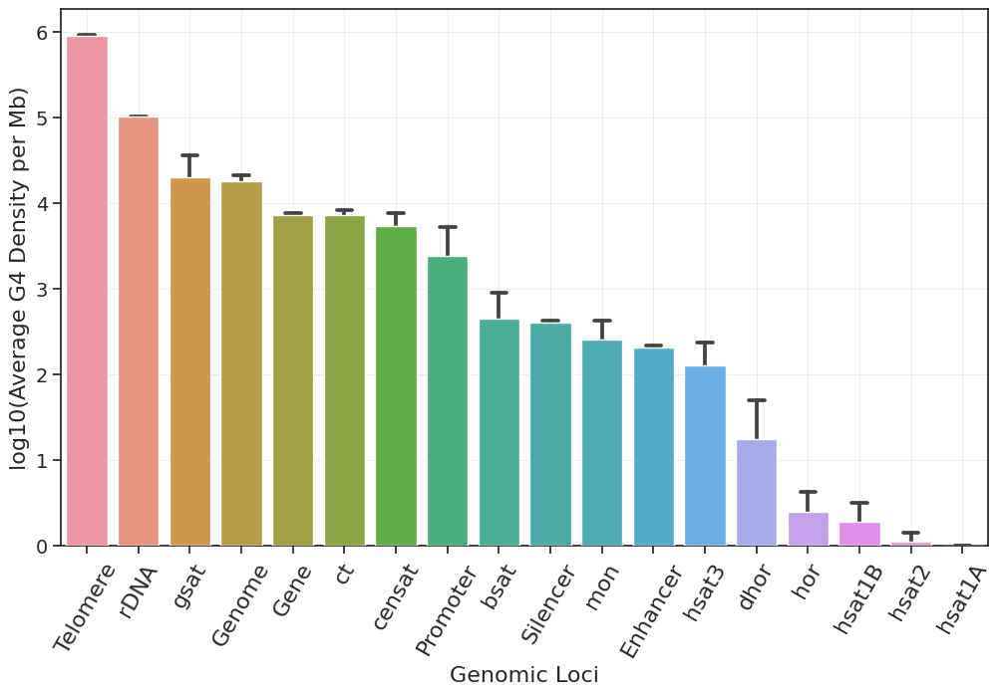

In [351]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 7))
sns.barplot(data=coverage_t2t_g4, 
            x="loci", 
            y="coverage_log", 
            zorder=3, 
            ax=ax, 
            capsize=.3,
            order=coverage_t2t_g4\
                    .groupby("loci")\
                    .agg({"coverage_log": "mean"})\
                    .sort_values(by=['coverage_log'], ascending=False)\
                    .index,
           )
ax.grid(lw=0.4, alpha=0.6, zorder=0)
ax.tick_params(axis="x", which="major", labelsize=16, rotation=60)
ax.tick_params(axis="y", labelsize=14, which="major")
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("log10(Average G4 Density per Mb)")
ax.xaxis.label.set_size(16)
ax.yaxis.label.set_size(16)
fig.savefig(f"{save_location}/chromosome_compartments_g4_homo_sapiens.png", bbox_inches='tight')

In [ ]:
coverage_t2t

/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


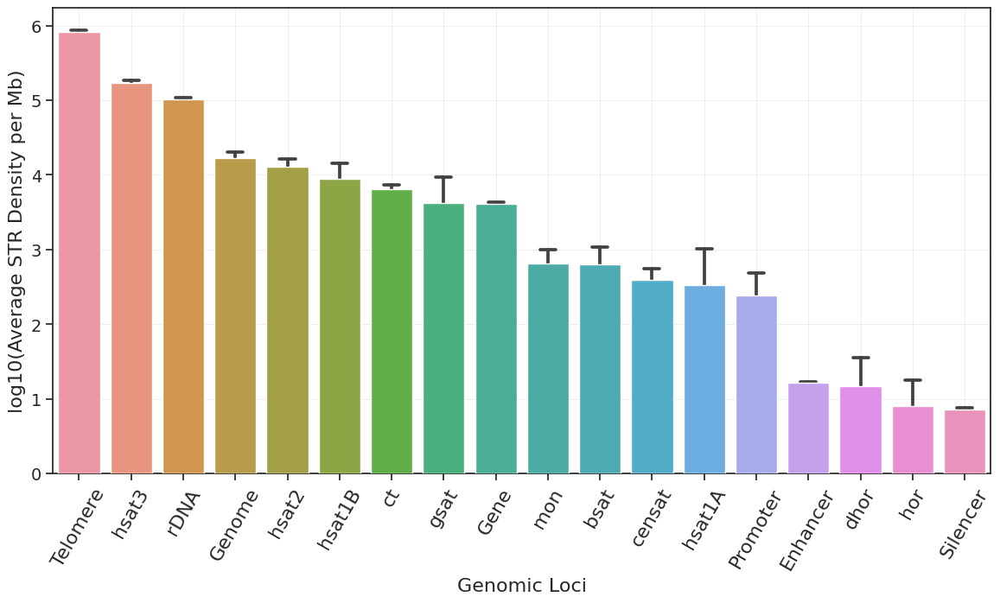

In [361]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 7))
sns.barplot(data=coverage_t2t.query("sru == 'all'"), 
            x="loci", 
            y="coverage_log", 
            zorder=3, 
            ax=ax, 
            capsize=.3,
            order=coverage_t2t.query("sru == 'all'")\
                    .groupby("loci")\
                    .agg({"coverage_log": "mean"})\
                    .sort_values(by=['coverage_log'], ascending=False)\
                    .index,
           )
ax.grid(lw=0.4, alpha=0.6, zorder=0)
ax.tick_params(axis="x", which="major", labelsize=16, rotation=60)
ax.tick_params(axis="y", labelsize=14, which="major")
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("log10(Average STR Density per Mb)")
ax.xaxis.label.set_size(16)
ax.yaxis.label.set_size(16)
fig.savefig(f"{save_location}/chromosome_compartments_STR_all_homo_sapiens.png", bbox_inches='tight')

In [366]:
coverage_t2t.groupby(["chromosome", "loci"], as_index=False).agg({"coverage_log": "mean"}).to_csv(
                                                                                    f"{save_location}/chromosome_and_loci_homo_sapiens_compartment_coverage_log.csv",
                                                                                    sep="\t",
                                                                                    index=False)
coverage_t2t.groupby(["loci"], as_index=False).agg({"coverage_log": "mean"}).to_csv(
                                                                                    f"{save_location}/loci_homo_sapiens_compartment_coverage_log.csv",
                                                                                    sep="\t",
                                                                                    index=False
                                                                                    )

In [372]:
coverage_t2t.groupby(["loci", "sru"], as_index=False).agg({"coverage_log": "mean"}).pivot(index="sru", values="coverage_log", columns="loci").to_csv(f"{save_location}/loci_homo_sapiens_table_per_sru.csv",
                                                                                                                                                     sep="\t",
                                                                                                                                    index=False
)

/tmp/ipykernel_602855/1654542262.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['sru'] = temp['sru'].astype(int)
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/li

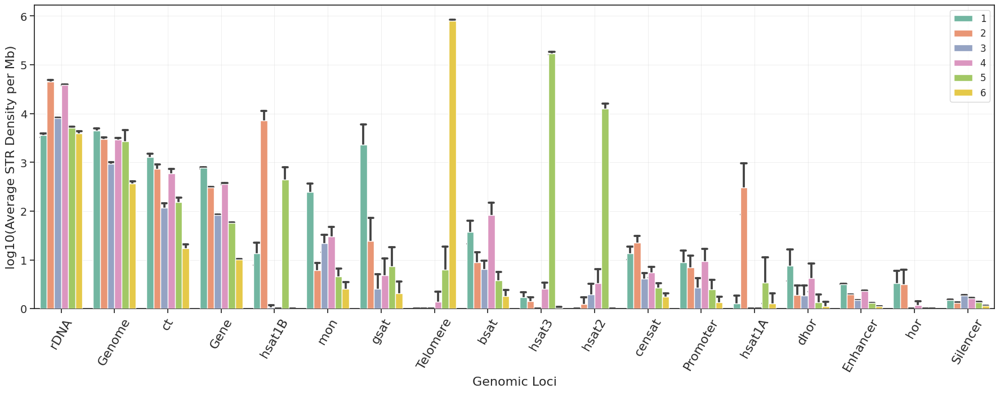

In [363]:
palette = sns.color_palette('Set2')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(22, 7))
temp = coverage_t2t.query("sru != 'all'")
temp['sru'] = temp['sru'].astype(int)
temp = temp.query("sru < 7")
sns.barplot(data=temp, 
            x="loci", 
            y="coverage_log", 
            hue="sru",
            dodge=True,
            zorder=3, 
            ax=ax, 
            capsize=.1,
            palette={i+1: palette[i] for i in range(6)},
            order=temp\
                .groupby("loci")\
                .agg({"coverage_log": "mean"})\
                .sort_values(by=['coverage_log'], ascending=False)\
                .index,
           )
ax.legend(title="", prop={"size": 12})
ax.grid(lw=0.4, alpha=0.6, zorder=0)
ax.tick_params(axis="x", which="major", labelsize=16, rotation=60)
ax.tick_params(axis="y", labelsize=14, which="major")
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("log10(Average STR Density per Mb)")
ax.xaxis.label.set_size(16)
ax.yaxis.label.set_size(16)
fig.savefig(f"{save_location}/chromosome_compartments_barplot_STR_below_7_homo_sapiens.png", bbox_inches='tight')

In [354]:
palette = sns.color_palette('Set2')[5:] + [sns.color_palette('Set2')[0]]
len(palette)

4

/tmp/ipykernel_602855/651236789.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['sru'] = temp['sru'].astype(int)
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib

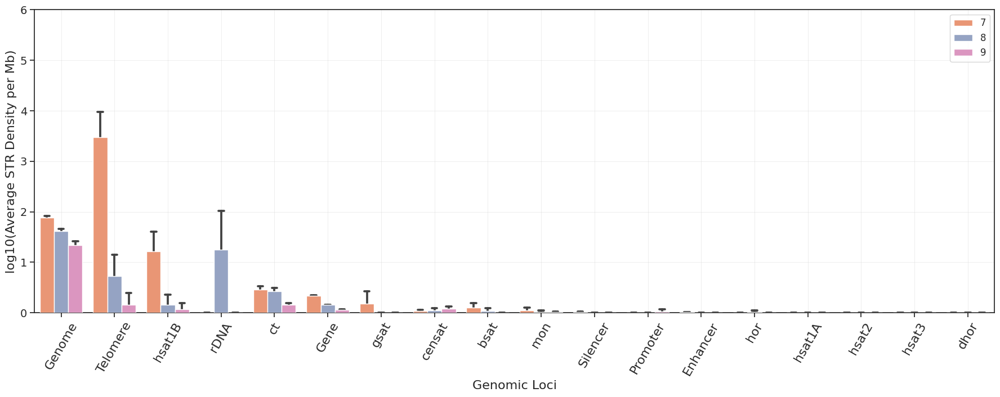

In [364]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(22, 7))
temp = coverage_t2t.query("sru != 'all'")
temp['sru'] = temp['sru'].astype(int)
temp = temp.query("sru > 6")
sns.barplot(data=temp, 
            x="loci", 
            y="coverage_log", 
            hue="sru",
            dodge=True,
            zorder=3, 
            ax=ax, 
            capsize=.1,
            palette={i+6: palette[i] for i in range(4)},
            order=temp\
                .groupby("loci")\
                .agg({"coverage_log": "mean"})\
                .sort_values(by=['coverage_log'], ascending=False)\
                .index,
           )
ax.legend(title="", prop={"size": 12})
ax.grid(lw=0.4, alpha=0.6, zorder=0)
ax.set_ylim(ymax=6.0)
ax.tick_params(axis="x", which="major", labelsize=16, rotation=60)
ax.tick_params(axis="y", labelsize=14, which="major")
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("log10(Average STR Density per Mb)")
ax.xaxis.label.set_size(16)
ax.yaxis.label.set_size(16)
fig.savefig(f"{save_location}/chromosome_compartments_barplot_STR_above_7mers_homo_sapiens.png", bbox_inches='tight')

In [375]:
coverage_t2t_pivot_g4 = coverage_2t2_g4\
                                .groupby(["chromosome", "loci"], as_index=False)\
                                .agg(medianLogCoverage=("coverage_log", "median"))\
                                .pivot(index="chromosome", 
                                        columns="loci", 
                                        values="medianLogCoverage")
coverage_t2t_pivot_g4 = coverage_t2t_pivot_g4.fillna(0.0)
coverage_t2t_pivot_g4 = coverage_t2t_pivot_g4.rename(columns={"Genome-Wide": "Genome"})
coverage_t2t_pivot_g4

loci,Enhancer,Gene,Genome,Promoter,Silencer,bsat,censat,ct,dhor,gsat,hor,hsat1A,hsat1B,hsat2,hsat3,mon,rDNA,telomere
chromosome,,,,,,,,,,,,,,,,,,
chr1,0.000000,4.210808,4.290925,4.537993,0.000000,4.565235,5.050420,4.035890,3.534584,4.391546,2.043128,0.0,0.0,0.0,3.860026,0.000000,0.000000,5.949339
chr10,0.000000,4.221689,4.275793,0.000000,0.000000,4.662164,4.772382,3.983622,0.000000,0.000000,0.000000,0.0,0.0,0.0,2.618672,3.466297,0.000000,5.957327
chr11,4.334845,4.305354,4.321020,4.886062,4.484435,0.000000,1.889517,4.104559,0.000000,0.000000,0.827569,0.0,0.0,0.0,0.000000,3.480344,0.000000,5.929652
chr12,0.000000,4.201177,4.250191,4.669123,0.000000,0.000000,4.680885,4.259206,1.308080,4.555113,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,5.955715
chr13,0.000000,4.160689,4.159230,0.000000,0.000000,4.420129,4.495634,4.085747,0.000000,4.552432,0.000000,0.0,0.0,0.0,3.720650,3.553856,4.991669,5.939157
chr14,0.000000,4.189521,4.256208,4.990704,4.114609,4.587166,4.480595,4.051179,3.580104,4.523632,0.000000,0.0,0.0,0.0,3.759771,3.555468,5.007489,5.934101
chr15,0.000000,4.311186,4.297498,4.466805,0.000000,4.506266,4.604402,4.089743,3.904386,4.547495,0.000000,0.0,0.0,0.0,3.977083,3.518830,5.010156,5.919654
chr16,4.352927,4.466415,4.368965,5.083161,4.945156,0.000000,4.601424,4.200758,0.000000,0.000000,0.744979,0.0,0.0,0.0,0.000000,3.342031,0.000000,5.935937
chr17,4.606808,4.560771,4.488764,5.074637,5.062371,0.000000,4.362519,4.307190,0.000000,0.000000,1.454845,0.0,0.0,0.0,3.501278,3.582427,0.000000,5.961838


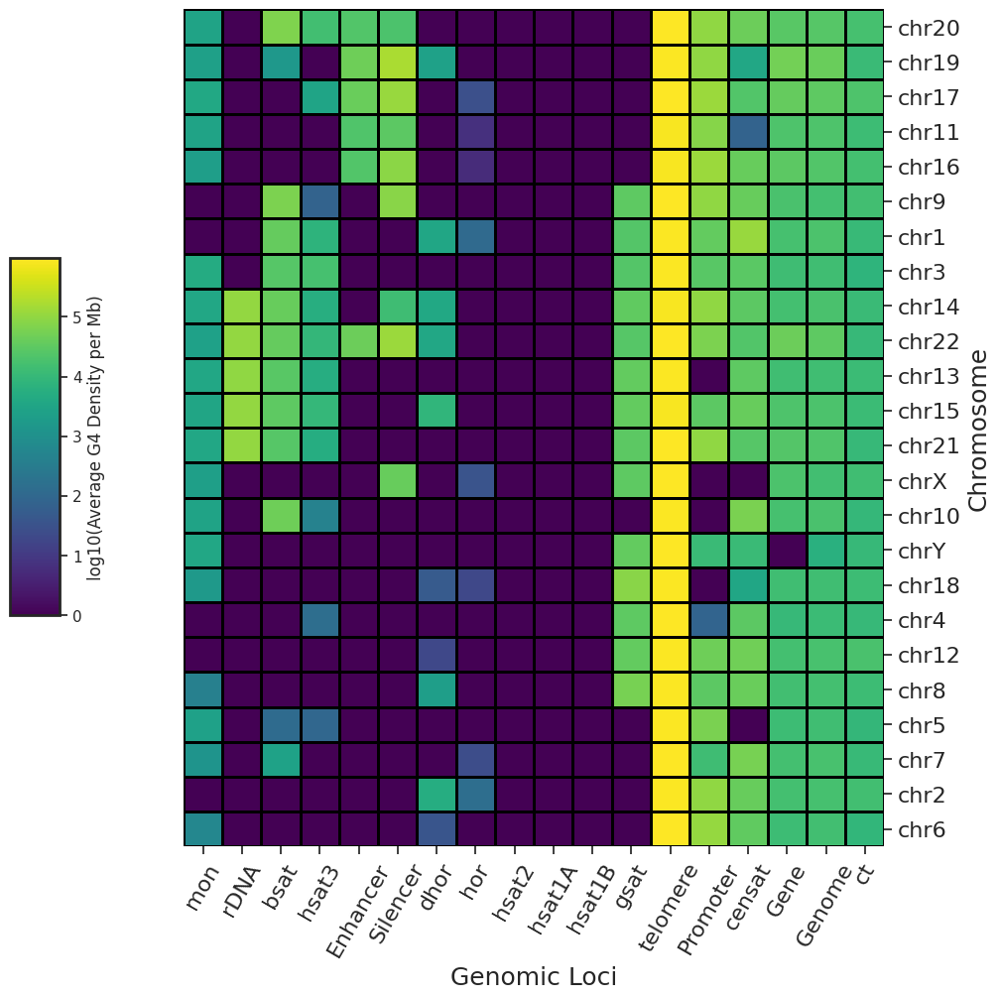

In [416]:
cg= sns.clustermap(coverage_t2t_pivot_g4,
                      cmap="viridis",
                   vmin=0,
                   row_cluster=True,
                   col_cluster=True,
                   method="average",
                   linewidth=1.0,
                   linecolor='black',
                   figsize=(10, 12),
                   )
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
ax = cg.ax_heatmap

ax.tick_params(axis="both", which="major", labelsize=16)
ax.tick_params(axis="x", which="major", rotation=60)

cg.ax_cbar.set_ylabel("log10(Average G4 Density per Mb)")
x0, _y0, _w, _h = cg.cbar_pos
cg.ax_cbar.set_position([x0, 0.3, 0.05, 0.3])

# cg.ax_cbar.tick_params(axis='x', length=10)
for spine in cg.ax_cbar.spines:
    # g.ax_cbar.spines[spine].set_color('crimson')
    cg.ax_cbar.spines[spine].set_linewidth(2)
    
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("Chromosome")
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)

fig = plt.gcf()
fig.savefig(f"{save_location}/chromosome_heatmap_homo_sapiens_gquadruplex.png", bbox_inches='tight')

In [417]:
coverage_t2t_pivot = coverage_t2t.query("sru == 'all'")\
                                .drop(columns=['sru'])\
                                .groupby(["chromosome", "loci"], as_index=False)\
                                .agg(medianLogCoverage=("coverage_log", "median"))\
                                .pivot(index="chromosome", 
                                        columns="loci", 
                                        values="medianLogCoverage")
coverage_t2t_pivot = coverage_t2t_pivot.fillna(0.0)
coverage_t2t_pivot

loci,Enhancer,Gene,Genome,Promoter,Silencer,Telomere,bsat,censat,ct,dhor,gsat,hor,hsat1A,hsat1B,hsat2,hsat3,mon,rDNA
chromosome,,,,,,,,,,,,,,,,,,
chr1,0.0,4.043464,4.168957,3.725271,0.0,5.925918,3.374565,3.613366,4.077560,3.133219,4.621016,1.840044,0.000000,0.000000,4.275279,5.472458,0.000000,0.000000
chr10,0.0,4.072994,4.160975,3.576145,0.0,5.934586,3.308863,3.838529,4.100584,0.000000,0.000000,1.107210,0.000000,0.000000,4.235777,5.327725,3.206743,0.000000
chr11,0.0,4.028722,4.084673,0.000000,0.0,5.932197,0.000000,2.295938,4.079774,0.000000,0.000000,0.576144,0.000000,0.000000,0.000000,0.000000,3.394527,0.000000
chr12,0.0,4.092538,4.126631,0.000000,0.0,5.892587,0.000000,0.000000,4.103820,2.770285,1.739002,1.399674,0.000000,0.000000,0.000000,0.000000,3.413216,0.000000
chr13,0.0,4.026525,4.215682,0.000000,0.0,5.952701,3.707425,3.737253,4.042650,0.000000,4.599684,0.000000,2.826530,4.480156,0.000000,5.308552,3.252455,5.056119
chr14,0.0,4.045601,4.241347,3.767576,0.0,5.924364,3.703727,3.554618,4.034089,1.494947,4.614588,0.000000,3.184487,4.416095,0.000000,5.305259,3.188491,5.009481
chr15,0.0,4.070158,4.364909,1.893943,0.0,5.911367,3.704037,3.905045,4.044904,3.291013,4.595620,0.000000,3.286367,4.316440,0.000000,5.309019,3.295567,5.003999
chr16,0.0,4.127748,4.167161,0.000000,0.0,5.920110,0.000000,3.558517,4.079543,1.406690,0.000000,0.510595,0.000000,0.000000,3.883322,5.395393,3.473122,0.000000
chr17,0.0,4.137338,4.243048,3.653309,0.0,5.950036,0.000000,3.862835,4.027252,0.000000,0.000000,1.100371,0.000000,0.000000,4.110523,5.192360,3.645962,0.000000


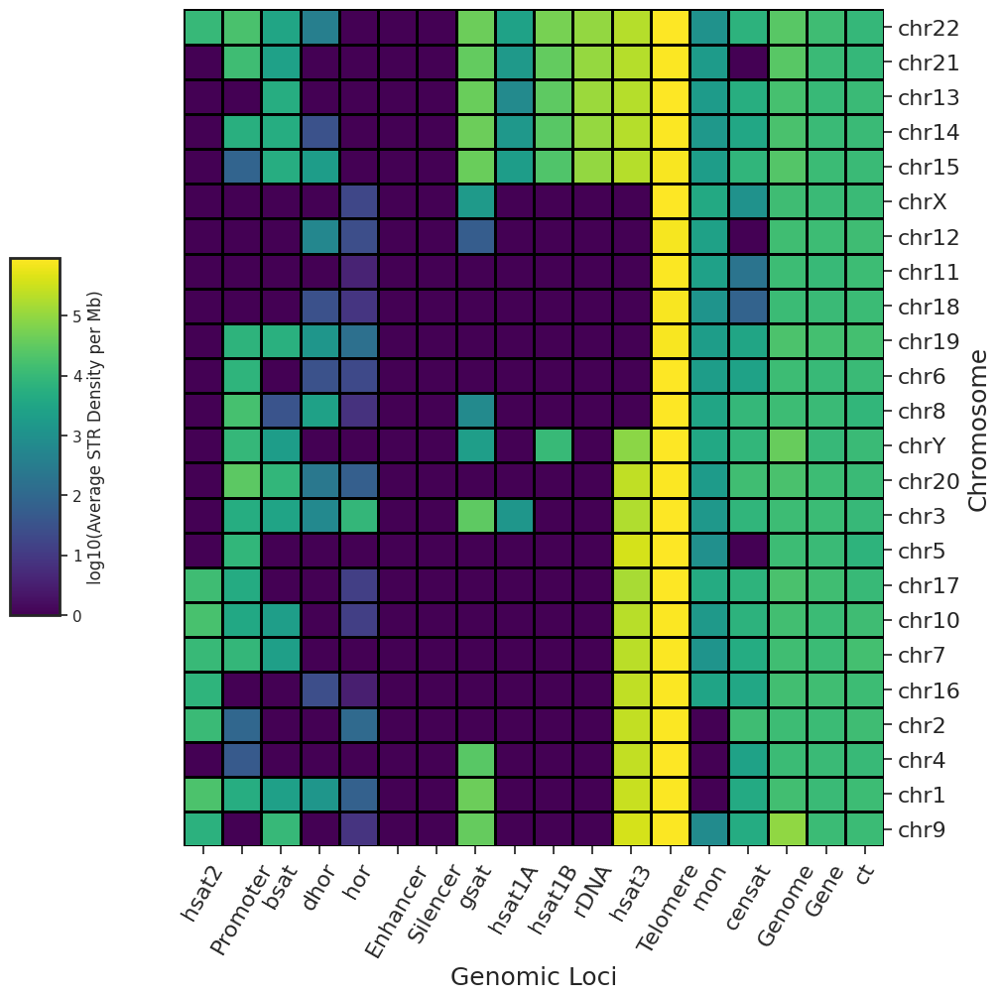

In [418]:
cg= sns.clustermap(coverage_t2t_pivot,
                      cmap="viridis",
                   vmin=0,
                   row_cluster=True,
                   col_cluster=True,
                   method="average",
                   linewidth=1.0,
                   linecolor='black',
                   figsize=(10, 12),
                   )
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
ax = cg.ax_heatmap

ax.tick_params(axis="both", which="major", labelsize=16)
ax.tick_params(axis="x", which="major", rotation=60)
ax.set_xlabel("Genomic Loci")
ax.set_ylabel("Chromosome")
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)

cg.ax_cbar.set_ylabel("log10(Average STR Density per Mb)")
x0, _y0, _w, _h = cg.cbar_pos
cg.ax_cbar.set_position([x0, 0.3, 0.05, 0.3])

# cg.ax_cbar.tick_params(axis='x', length=10)
for spine in cg.ax_cbar.spines:
    # g.ax_cbar.spines[spine].set_color('crimson')
    cg.ax_cbar.spines[spine].set_linewidth(2)


fig = plt.gcf()
fig.savefig(f"{save_location}/chromosome_heatmap_homo_sapiens_sru.png", bbox_inches='tight')

In [414]:
save_location

PosixPath('/storage/group/izg5139/default/external/satellites/human')

1


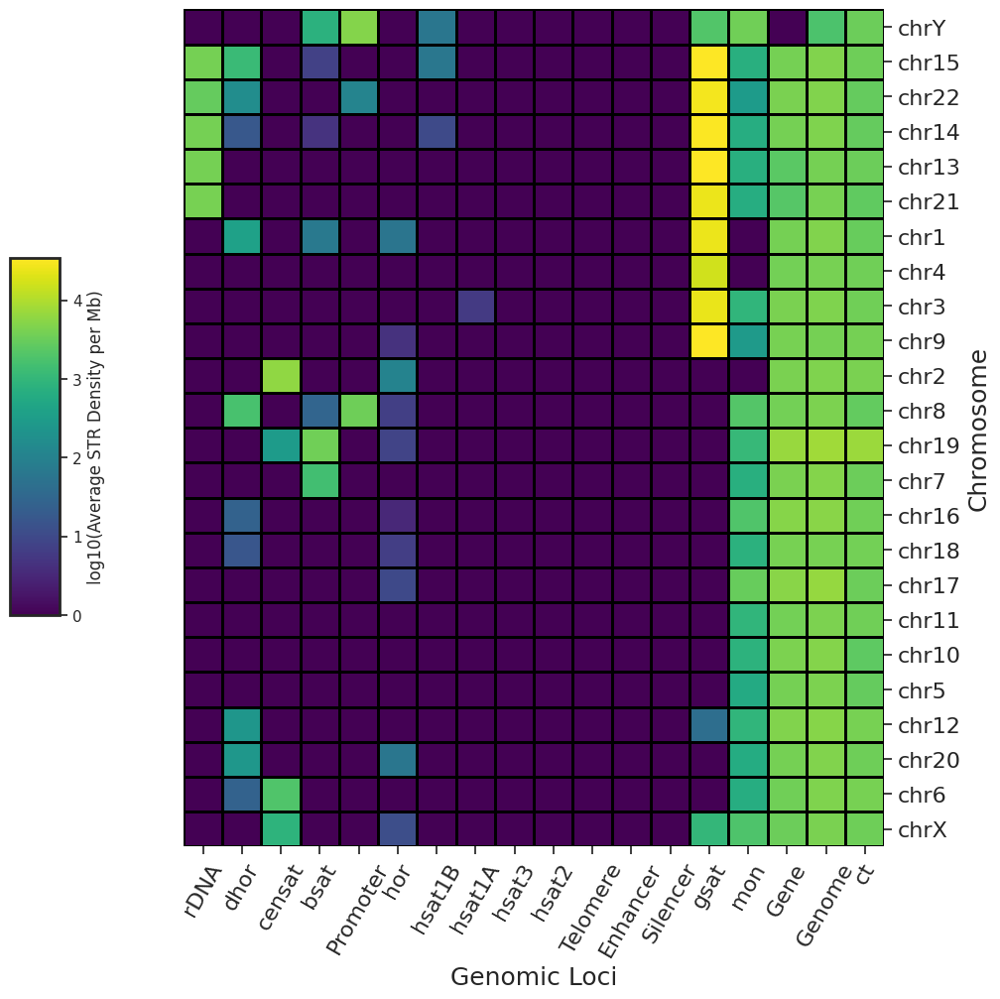

2


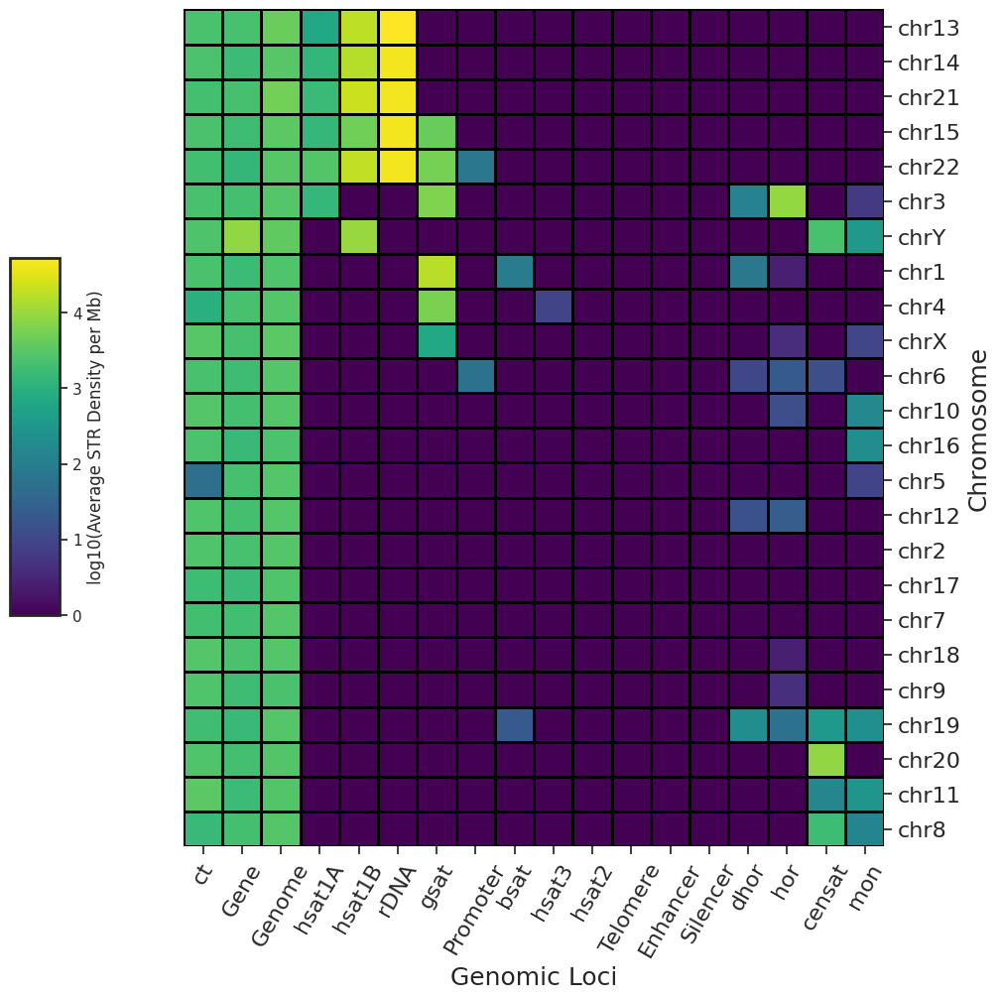

3


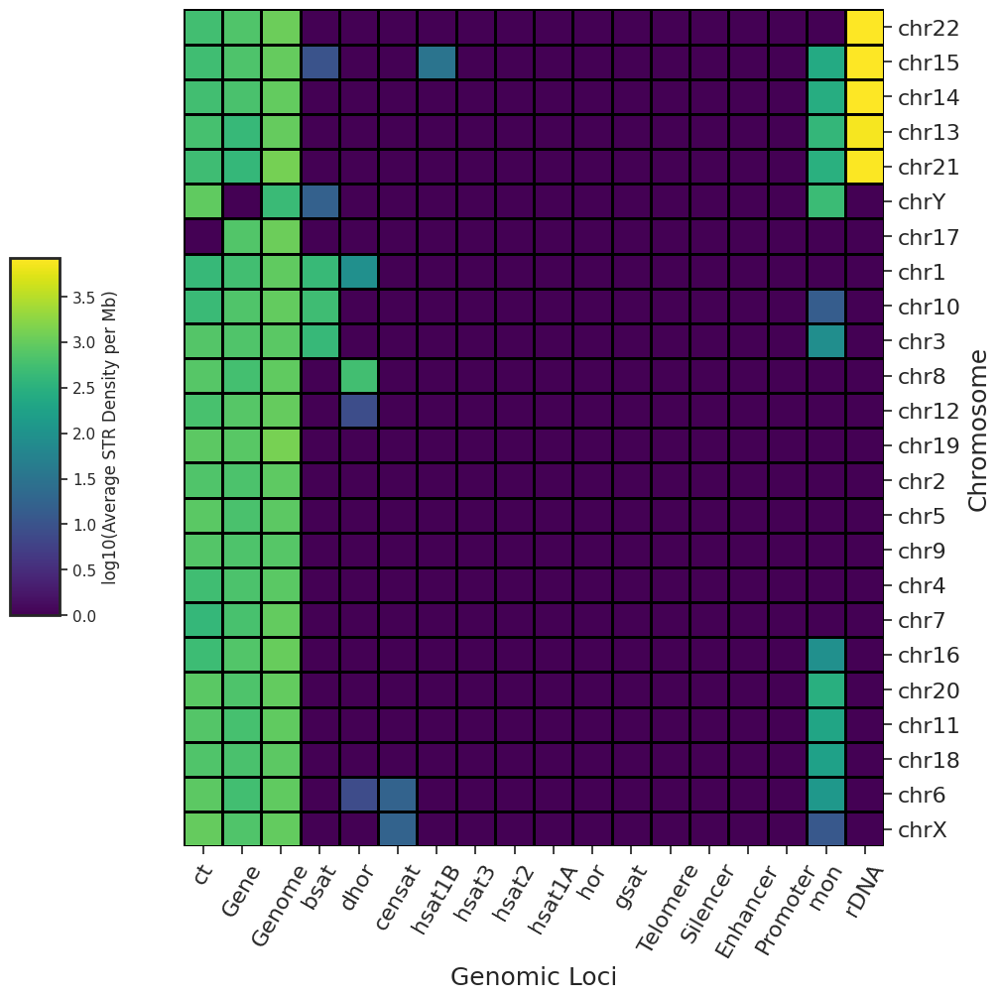

4


In [ ]:
for sru in sru_list:
    print(sru)
    coverage_t2t_pivot = coverage_t2t.query(f"sru == '{sru}'")\
                                .drop(columns=['sru'])\
                                .groupby(["chromosome", "loci"], as_index=False)\
                                .agg(medianLogCoverage=("coverage_log", "median"))\
                                .pivot(index="chromosome", 
                                        columns="loci", 
                                        values="medianLogCoverage")
    coverage_t2t_pivot = coverage_t2t_pivot.fillna(0.0)
    
    cg= sns.clustermap(coverage_t2t_pivot,
                          cmap="viridis",
                       vmin=0,
                       row_cluster=True,
                       col_cluster=True,
                       method="average",
                       linewidth=1.0,
                       linecolor='black',
                       figsize=(10, 12),
                       )
    cg.ax_row_dendrogram.set_visible(False)
    cg.ax_col_dendrogram.set_visible(False)
    ax = cg.ax_heatmap
    
    ax.tick_params(axis="both", which="major", labelsize=16)
    ax.tick_params(axis="x", which="major", rotation=60)
    ax.set_xlabel("Genomic Loci")
    ax.set_ylabel("Chromosome")
    ax.xaxis.label.set_size(18)
    ax.yaxis.label.set_size(18)

    cg.ax_cbar.set_ylabel("log10(Average STR Density per Mb)")
    x0, _y0, _w, _h = cg.cbar_pos
    cg.ax_cbar.set_position([x0, 0.3, 0.05, 0.3])
    
    # cg.ax_cbar.tick_params(axis='x', length=10)
    for spine in cg.ax_cbar.spines:
        # g.ax_cbar.spines[spine].set_color('crimson')
        cg.ax_cbar.spines[spine].set_linewidth(2)

    fig = plt.gcf()
    fig.savefig(f"{save_location}/chromosome_heatmap_homo_sapiens_sru_{sru}.png", bbox_inches='tight')
    plt.show()
    plt.close()


In [44]:
coverage_t2t

,chromosome,start,end,counts,loci,hits,bpCovering,totalBp,coverage,sru,coverage_log
0,chr1,0,3000,1,telomere,0,0,3000,0.000000,1,0.000000
1,chr1,116796047,121405145,1,ct,1298,17940,4609098,0.003892,1,3.590318
2,chr1,121405145,121406286,1,censat,0,0,1141,0.000000,1,0.000000
3,chr1,121406286,121619169,1,ct,64,863,212883,0.004054,1,3.607980
4,chr1,121619169,121788213,3,hor,1,33,169044,0.000195,1,2.292699
...,...,...,...,...,...,...,...,...,...,...,...
2423,chrY,62052955,62059882,1,censat,3,47,6927,0.006785,all,3.831614
2424,chrY,62061431,62072743,1,hsat3,117,1788,11312,0.158062,all,5.198831
2425,chrY,62072743,62087298,1,bsat,0,0,14555,0.000000,all,0.000000
2426,chrY,62452320,62453637,1,censat,1,11,1317,0.008352,all,3.921858


In [405]:
save_location

PosixPath('/storage/group/izg5139/default/external/satellites/human')

/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/storage/group/izg5139/default/nicole/miniconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categ

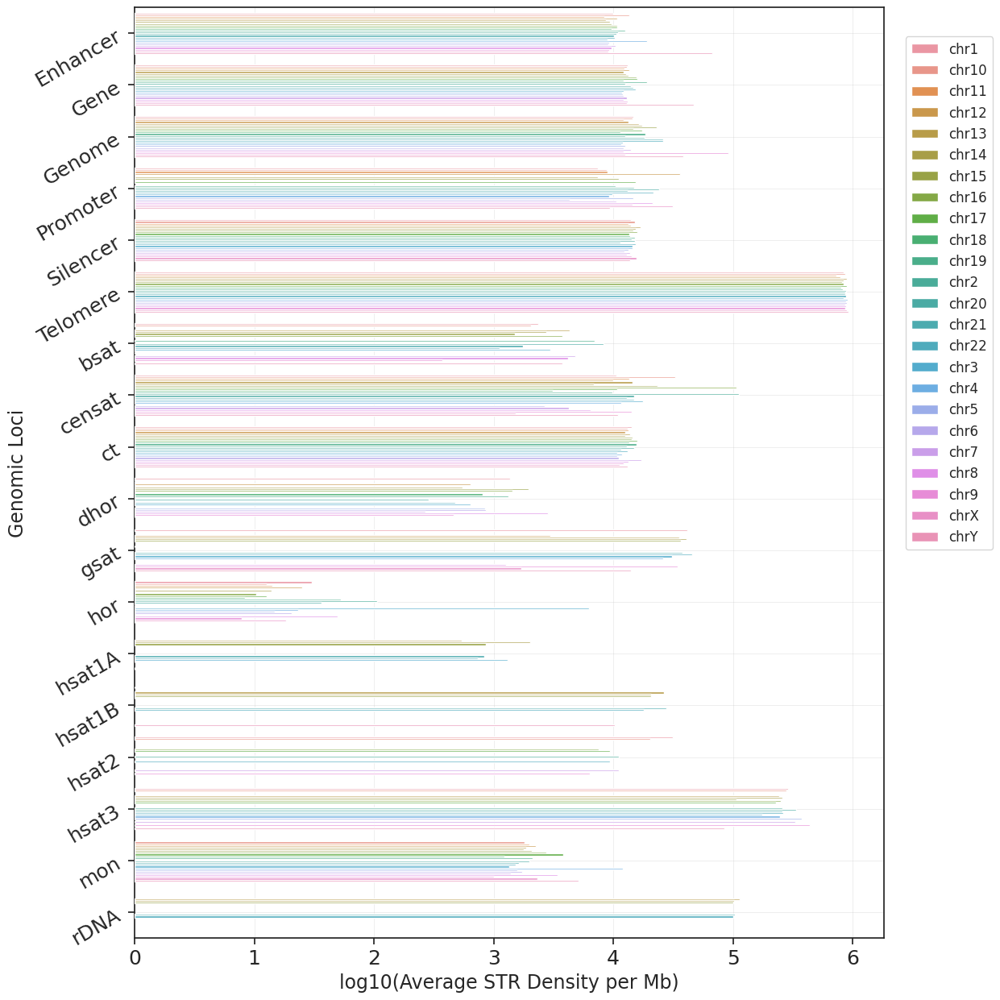

In [398]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 15))
temp = coverage_t2t.query("sru == 'all'")\
            .groupby(["loci", "chromosome"], as_index=False)\
            .agg({"bpCovering": "sum", 
                  "totalBp": "sum"})\
            .assign(coverage=lambda ds: ds['bpCovering'].div(ds['totalBp']) * 1e6)\
            .assign(coverage=lambda ds: ds['coverage'].apply(lambda y: math.log(y+1, 10)))

sns.barplot(data=temp, 
          y="loci", 
          x="coverage",
           hue="chromosome",
            orient="h",
            # hue_order=['chrY', 'chrX'],
            # palette={'chrX': '#9f59cf', 'chrY': '#eb44cc'},
           ax=ax,
            capsize=0.0,
           zorder=3)
ax.legend(title="", prop={"size": 12}, bbox_to_anchor=(1.02, 0.41))
ax.grid(lw=0.4, alpha=0.6, zorder=0)
ax.tick_params(axis="both", which="major", labelsize=18)
ax.tick_params(axis="y", which="major", rotation=30)
ax.set_ylabel("Genomic Loci")
ax.set_xlabel("log10(Average STR Density per Mb)")
ax.xaxis.label.set_size(17)
ax.yaxis.label.set_size(17)
fig.savefig(f"{save_location}/chromosome_compartments_homo_sapiens_barplot.png", bbox_inches='tight')


# Part II: Primates Analysis

In [45]:
import dask.dataframe as dd
import re

chr_sizes = dd.read_csv("/storage/group/izg5139/default/external/satellites/scripts/chromosome_prim*.txt", delimiter="\t").compute()
chr_sizes.loc[:, "#assembly_accession"] = chr_sizes["#assembly_accession"].apply(lambda x: re.split('\.', x)[0])
chr_sizes = chr_sizes[chr_sizes['#assembly_accession'] == 'chm13v2']
chr_sizes = chr_sizes.rename(columns={"chrLen": "chrLength"})
chr_sizes

/tmp/ipykernel_1167541/3633364630.py:1: DeprecationWarning: The current Dask DataFrame implementation is deprecated. 
In a future release, Dask DataFrame will use a new implementation that
contains several improvements including a logical query planning.
The user-facing DataFrame API will remain unchanged.

The new implementation is already available and can be enabled by
installing the dask-expr library:

    $ pip install dask-expr

and turning the query planning option on:

    >>> import dask
    >>> dask.config.set({'dataframe.query-planning': True})
    >>> import dask.dataframe as dd

API documentation for the new implementation is available at
https://docs.dask.org/en/stable/dask-expr-api.html

Any feedback can be reported on the Dask issue tracker
https://github.com/dask/dask/issues 

To disable this warning in the future, set dask config:

    # via Python
    >>> dask.config.set({'dataframe.query-planning-warning': False})

    # via CLI
    dask config set dataframe.query-p

,#assembly_accession,chromosome,chrLength
0,chm13v2,chr1,248387328
1,chm13v2,chr2,242696752
2,chm13v2,chr3,201105948
3,chm13v2,chr4,193574945
4,chm13v2,chr5,182045439
5,chm13v2,chr6,172126628
6,chm13v2,chr7,160567428
7,chm13v2,chr8,146259331
8,chm13v2,chr9,150617247
9,chm13v2,chr10,134758134


In [46]:
density_path = Path("/storage/group/izg5139/default/external/satellites/scripts/density_human")
density_path.mkdir(exist_ok=True)

In [47]:
t2t_df = human_centromere.groupby(
                                 "chromosome", 
                                  as_index=False
                                 )\
                            .agg({"start": "min", "end": "max"})
t2t_df

,chromosome,start,end
0,chr1,116796047,147241659
1,chr10,34633793,46664589
2,chr11,46061947,59413484
3,chr12,29620498,42202490
4,chr13,0,22498291
5,chr14,0,17708240
6,chr15,0,22694129
7,chr16,30848286,57219471
8,chr17,18892419,32486939
9,chr18,10965698,25933550


In [48]:
color_palette = sns.color_palette('Set2') + sns.color_palette('Set3')[2:3]
color_palette

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254),
 (0.7450980392156863, 0.7294117647058823, 0.8549019607843137)]

In [49]:
density_path

PosixPath('/storage/group/izg5139/default/external/satellites/scripts/density_human')

In [54]:
compartments = human_centromere['compartment'].unique()
compartments

array(['ct', 'censat', 'hor', 'dhor', 'hsat2', 'hsat3', 'gsat', 'bsat',
       'mon', 'hsat1A', 'hsat1B', 'rDNA'], dtype=object)

In [57]:
human_cen_df = human_centromere.groupby(["chromosome", "compartment"], as_index=False).agg({
                                            "start": "min",
                                            "end": "max"
                                            })
human_cen_df

,chromosome,compartment,start,end
0,chr1,bsat,128098615,128594818
1,chr1,censat,121405145,144008994
2,chr1,ct,116796047,147241659
3,chr1,dhor,126701150,126824128
4,chr1,gsat,127772418,127775625
...,...,...,...,...
188,chrY,gsat,11317900,19252094
189,chrY,hor,10565750,10883085
190,chrY,hsat1B,28660072,62025776
191,chrY,hsat3,10888338,62072743


In [ ]:
t2t_df = human_centromere.groupby(
                                 "chromosome", 
                                  as_index=False
                                 )\
                            .agg({"start": "min", "end": "max"})
t2t_df

In [ ]:
centromere_df = t2t_df.merge(chr_sizes,
                                      on="chromosome",
                                      how="left"
                                      )\
                                .dropna(subset=['chrLength'])

centromere_df['start'] = (1 + np.floor(centromere_df["start"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df['end'] = (1 + np.floor(centromere_df["end"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df = centromere_df.set_index("chromosome").to_dict()

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("white")
sns.set_theme(style = "ticks")
total_bins = 2000

str_df = tandem_human
str_df = str_df.merge(
                    chr_sizes,
                    on="chromosome",
                    how="left"
        ).dropna(subset=['chrLength'])


centromere_df = human_cen_df.merge(chr_sizes,
                                      on="chromosome",
                                      how="left"
                                      )\
                                .dropna(subset=['chrLength'])

centromere_df['start'] = (1 + np.floor(centromere_df["start"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df['end'] = (1 + np.floor(centromere_df["end"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df

,chromosome,compartment,start,end,#assembly_accession,chrLength
0,chr1,bsat,1032,1036,chm13v2,248387328
1,chr1,censat,978,1160,chm13v2,248387328
2,chr1,ct,941,1186,chm13v2,248387328
3,chr1,dhor,1021,1022,chm13v2,248387328
4,chr1,gsat,1029,1029,chm13v2,248387328
...,...,...,...,...,...,...
188,chrY,gsat,363,617,chm13v2,62460029
189,chrY,hor,339,349,chm13v2,62460029
190,chrY,hsat1B,918,1987,chm13v2,62460029
191,chrY,hsat3,349,1988,chm13v2,62460029


In [93]:
human_cen_df[["chromosome", "start", "end", "compartment"]]\
            .sort_values(by=["chromosome", "start"], ascending=True).to_csv("human_str.bed", sep="\t", index=False, header=None)
merged_cen = "human_str.merged.bed"
command = f"{bedtools} merge -i human_str.bed -c 4 -o collapse > {merged_cen}"
subprocess.run(command, shell=True, check=True)


df_merged_cen = pd.read_csv(merged_cen, delimiter="\t", header=None)
df_merged_cen

,0,1,2,3
0,chr1,116796047,147241659,"ct,censat,hor,dhor,hsat2,hsat3,gsat,bsat"
1,chr10,34633793,46664589,"ct,hsat3,hsat2,censat,mon,dhor,hor,bsat,hsat1B"
2,chr11,46061947,59413484,"ct,mon,censat,dhor,hor"
3,chr12,29620498,42202490,"ct,censat,gsat,mon,dhor,hor"
4,chr13,0,22498291,"censat,hsat3,hsat1A,bsat,ct,gsat,rDNA,hsat1B,m..."
5,chr14,0,17708240,"censat,ct,hsat3,bsat,hsat1A,gsat,rDNA,hsat1B,m..."
6,chr15,0,22694129,"censat,ct,gsat,hsat3,bsat,hsat1A,rDNA,hsat1B,m..."
7,chr16,30848286,57219471,"ct,censat,bsat,mon,hsat1B,hsat3,hsat2,dhor,hor"
8,chr17,18892419,32486939,"ct,censat,hsat3,hsat2,mon,hor,dhor"
9,chr18,10965698,25933550,"ct,censat,gsat,mon,dhor,hor"


In [69]:
centromere_str = centromere_df.groupby(["chromosome"]).agg({"compartment": lambda ds: ds.tolist(),
                                           "start": lambda ds: ds.tolist(),
                                           "end": lambda ds: ds.tolist(),
                                          }).to_dict()
centromere_str

{'compartment': {'chr1': ['bsat',
   'censat',
   'ct',
   'dhor',
   'gsat',
   'hor',
   'hsat2',
   'hsat3'],
  'chr10': ['bsat',
   'censat',
   'ct',
   'dhor',
   'hor',
   'hsat1B',
   'hsat2',
   'hsat3',
   'mon'],
  'chr11': ['censat', 'ct', 'dhor', 'hor', 'mon'],
  'chr12': ['censat', 'ct', 'dhor', 'gsat', 'hor', 'mon'],
  'chr13': ['bsat',
   'censat',
   'ct',
   'dhor',
   'gsat',
   'hor',
   'hsat1A',
   'hsat1B',
   'hsat3',
   'mon',
   'rDNA'],
  'chr14': ['bsat',
   'censat',
   'ct',
   'dhor',
   'gsat',
   'hor',
   'hsat1A',
   'hsat1B',
   'hsat3',
   'mon',
   'rDNA'],
  'chr15': ['bsat',
   'censat',
   'ct',
   'dhor',
   'gsat',
   'hor',
   'hsat1A',
   'hsat1B',
   'hsat3',
   'mon',
   'rDNA'],
  'chr16': ['bsat',
   'censat',
   'ct',
   'dhor',
   'hor',
   'hsat1B',
   'hsat2',
   'hsat3',
   'mon'],
  'chr17': ['censat', 'ct', 'dhor', 'hor', 'hsat2', 'hsat3', 'mon'],
  'chr18': ['censat', 'ct', 'dhor', 'gsat', 'hor', 'mon'],
  'chr19': ['bsat', 'cens

In [80]:
compartments

array(['ct', 'censat', 'hor', 'dhor', 'hsat2', 'hsat3', 'gsat', 'bsat',
       'mon', 'hsat1A', 'hsat1B', 'rDNA'], dtype=object)

In [86]:
sns.color_palette("hls", 10)

[(0.86, 0.3712, 0.33999999999999997),
 (0.86, 0.6832, 0.33999999999999997),
 (0.7247999999999999, 0.86, 0.33999999999999997),
 (0.41279999999999994, 0.86, 0.33999999999999997),
 (0.33999999999999997, 0.86, 0.5792000000000002),
 (0.33999999999999997, 0.8287999999999999, 0.86),
 (0.33999999999999997, 0.5167999999999995, 0.86),
 (0.4752000000000003, 0.33999999999999997, 0.86),
 (0.7871999999999999, 0.33999999999999997, 0.86),
 (0.86, 0.33999999999999997, 0.6207999999999999)]

In [89]:
comp_palette = {"ct": "#7ee312",
                "censat": "#ed5858",
                "hor": "#d4d64f",
                "dhor": "#6c6e15",
                "hsat1A": "#1cd987",
                "hsat1B": "#649e85",
                "hsat2": "#64919e",
                "hsat3": "#5461a1",
                "gsat": "#845bb0",
                "bsat": "#80577c",
                "mon": "#9c979b",
                "rDNA": "#eba544",
               }

In [111]:
comp_palette = {comp: color for comp, color in zip(compartments, sns.color_palette("hls", len(compartments)))}
comp_palette

{'ct': (0.86, 0.3712, 0.33999999999999997),
 'censat': (0.86, 0.6312, 0.33999999999999997),
 'hor': (0.8287999999999999, 0.86, 0.33999999999999997),
 'dhor': (0.5688000000000001, 0.86, 0.33999999999999997),
 'hsat2': (0.33999999999999997, 0.86, 0.3712),
 'hsat3': (0.33999999999999997, 0.86, 0.6312),
 'gsat': (0.33999999999999997, 0.8287999999999999, 0.86),
 'bsat': (0.33999999999999997, 0.5688000000000001, 0.86),
 'mon': (0.3712, 0.33999999999999997, 0.86),
 'hsat1A': (0.6311999999999998, 0.33999999999999997, 0.86),
 'hsat1B': (0.86, 0.33999999999999997, 0.8287999999999999),
 'rDNA': (0.86, 0.33999999999999997, 0.5688000000000001)}

In [160]:
centromere_df

{'start': {'chr1': 941,
  'chr10': 515,
  'chr11': 682,
  'chr12': 445,
  'chr13': 1,
  'chr14': 1,
  'chr15': 1,
  'chr16': 641,
  'chr17': 449,
  'chr18': 273,
  'chr19': 638,
  'chr2': 709,
  'chr20': 646,
  'chr21': 1,
  'chr22': 1,
  'chr3': 854,
  'chr4': 462,
  'chr5': 463,
  'chr6': 620,
  'chr7': 691,
  'chr8': 537,
  'chr9': 531,
  'chrX': 685,
  'chrY': 1},
 'end': {'chr1': 1186,
  'chr10': 693,
  'chr11': 880,
  'chr12': 634,
  'chr13': 397,
  'chr14': 351,
  'chr15': 456,
  'chr16': 1188,
  'chr17': 771,
  'chr18': 644,
  'chr19': 1127,
  'chr2': 822,
  'chr20': 1147,
  'chr21': 725,
  'chr22': 808,
  'chr3': 1009,
  'chr4': 619,
  'chr5': 600,
  'chr6': 768,
  'chr7': 856,
  'chr8': 702,
  'chr9': 1085,
  'chrX': 855,
  'chrY': 2000},
 '#assembly_accession': {'chr1': 'chm13v2',
  'chr10': 'chm13v2',
  'chr11': 'chm13v2',
  'chr12': 'chm13v2',
  'chr13': 'chm13v2',
  'chr14': 'chm13v2',
  'chr15': 'chm13v2',
  'chr16': 'chm13v2',
  'chr17': 'chm13v2',
  'chr18': 'chm13v2',

In [162]:
from collections import defaultdict

bin_categories = defaultdict(lambda : defaultdict(set))

valid = {"hsat1A", "hsat1B", "hsat2", "hsat3", "ct", "rDNA"}
for _, row in centromere_df.iterrows():
        start = row['start']
        end = row['end']
        chromosome = row['chromosome']
        compartment = row['compartment']
        # if compartment not in valid:
        #    continue
    

        for i in range(start, end+1):
            bin_categories[chromosome][i].add(compartment)

In [138]:
intervals = {}

for chromosome in bin_categories:
    intervals.update({chromosome: defaultdict(set)})
    temp = bin_categories[chromosome]

    positions = sorted(list(temp.keys()))
    current_list = None
    least_bin = None
    
    for i in range(len(positions)-1):
        if current_list is None:
            least_bin = positions[i]
            current_list = temp[positions[i]]

        if temp[positions[i+1]] != current_list:
            intervals[chromosome].update({ (least_bin, positions[i]): current_list})
            current_list = None

In [150]:
intervals

{'chr1': defaultdict(set,
             {(941, 1021): {'ct'},
              (1022, 1026): {'ct', 'hsat2'},
              (1027, 1037): {'ct', 'hsat2', 'hsat3'},
              (1038, 1149): {'ct', 'hsat2'}}),
 'chr10': defaultdict(set,
             {(515, 571): {'ct'},
              (572, 573): {'ct', 'hsat3'},
              (574, 639): {'ct', 'hsat2', 'hsat3'},
              (640, 642): {'ct', 'hsat3'},
              (643, 644): {'ct'},
              (645, 645): {'ct', 'hsat1B'}}),
 'chr11': defaultdict(set, {}),
 'chr12': defaultdict(set, {}),
 'chr13': defaultdict(set,
             {(1, 1): {'hsat3'},
              (2, 90): {'hsat1A', 'hsat3'},
              (91, 101): {'ct', 'hsat1A', 'hsat3'},
              (102, 165): {'ct', 'hsat1A', 'hsat3', 'rDNA'},
              (166, 179): {'ct', 'hsat1A', 'hsat3'},
              (180, 237): {'ct', 'hsat1A', 'hsat1B', 'hsat3'},
              (238, 246): {'ct', 'hsat1A', 'hsat1B'},
              (247, 274): {'ct', 'hsat1A'}}),
 'chr14': default

In [130]:
centromere_df.query("chromosome == 'chr2'").sort_values(by=['start'])

,chromosome,compartment,start,end,#assembly_accession,chrLength
90,chr2,ct,709,822,chm13v2,242696752
89,chr2,censat,721,808,chm13v2,242696752
93,chr2,hsat2,737,782,chm13v2,242696752
94,chr2,hsat3,737,745,chm13v2,242696752
91,chr2,dhor,761,784,chm13v2,242696752
92,chr2,hor,761,781,chm13v2,242696752
95,chr2,mon,784,811,chm13v2,242696752


In [139]:
intervals['chr2']

defaultdict(set,
            {(709, 736): {'ct'},
             (737, 745): {'ct', 'hsat2', 'hsat3'},
             (746, 782): {'ct', 'hsat2'}})

In [102]:
tdf = centromere_df.groupby(["start"], as_index=False)\
                    .agg({"compartment": lambda ds: ds.tolist()})
tdf

,start,compartment
0,1,"[censat, hsat3, censat, censat, ct, censat, ct..."
1,2,[hsat1A]
2,4,[gsat]
3,5,[ct]
4,7,[hsat3]
...,...,...
146,1021,[dhor]
147,1022,[hsat2]
148,1027,[hsat3]
149,1029,[gsat]


In [142]:
ax[0].get_xlim()

(-20.0, 2020.0)

100%|██████████| 256346/256346 [00:16<00:00, 15296.03it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


chr1


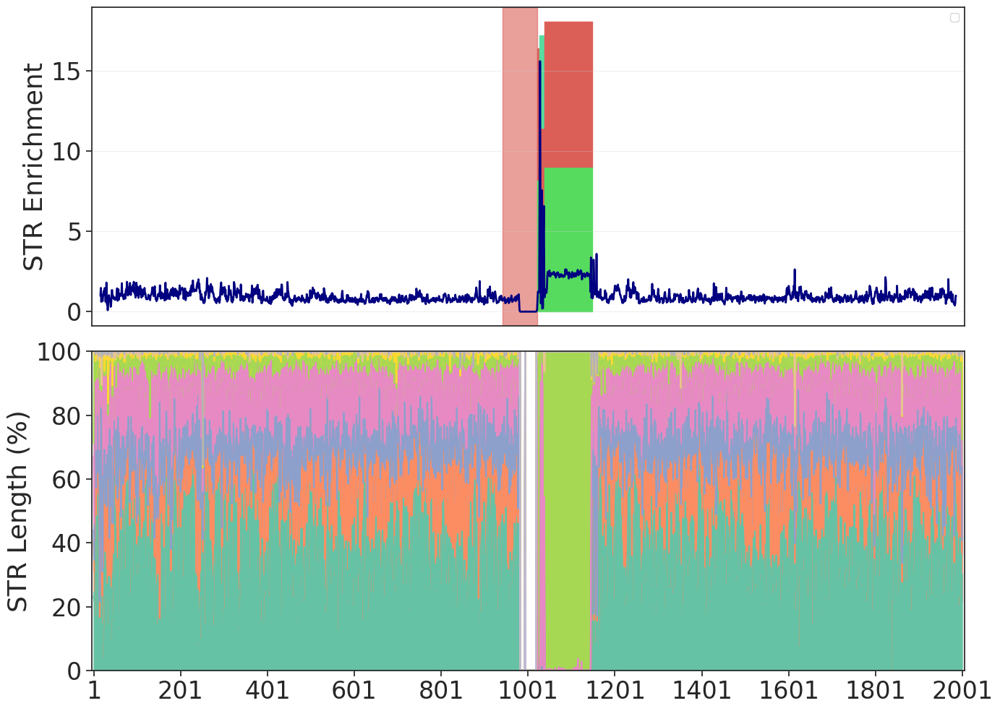

In [145]:
str_df["start"] = str_df["start"] - 1
str_df["end"] = str_df["end"] - 1

str_df['start_bin'] = (1 + np.floor(str_df["start"] * total_bins / str_df["chrLength"])).astype(int)
str_df['end_bin'] = (1 + np.floor(str_df["end"] * total_bins / str_df["chrLength"])).astype(int)

# str_df.to_csv(f"density/density_{species}.csv", sep="\t", index=False, mode="w")

chromosomes = str_df['chromosome'].unique()
bin_counts = {}
for chromo in chromosomes:
    bin_counts.update({chromo: {sru: np.zeros(2000) for sru in range(1, 10, 1)}})
    
temp = str_df.groupby(["chromosome", "start_bin", "end_bin", "sru"], as_index=False)\
                .agg(counts=("consensus", "count"))

for _, row in tqdm(temp.iterrows(), total=temp.shape[0], leave=True, position=0):
    start = row["start_bin"]
    end = row["end_bin"]
    chromosome = row["chromosome"]
    counts = row["counts"]
    sru = int(row["sru"])
    
    for ii in range(start, end+1):
        bin_counts[chromosome][sru][ii-1] += counts
        
# for chromosome in bin_counts.keys():
#    pd.DataFrame(bin_counts[chromosome]).to_csv(f"bin_counts/{species}_{chromosome}_bin_counts.txt", sep="\t")

for chromosome in bin_counts:
    print(chromosome)

    if chromosome == "chrM":
        continue
        
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(14, 10))
    t = pd.DataFrame(bin_counts[chromosome]).T
    u = t.sum(axis=0) #/average
    average = u.mean()
    u = u /average

    t = 100 * (t/t.sum(axis=0))
    t.columns = [str(i) for i in t]
    t = t.T
    maximum_enrichment = u.max()

    ax[0].plot(range(1, 2001), u.values, lw=2.0, zorder=5, alpha=1.0, color='navy')
    
    compartments_cen = centromere_str['compartment'][chromosome]
    start_points = centromere_str['start'][chromosome]
    end_points = centromere_str['end'][chromosome]
                 
    intervals_chromosome = intervals[chromosome]
    
    for interval, listing in intervals_chromosome.items():
        start_int, end_int = interval

        total_length = len(listing)
        listing = list(listing)
        if total_length == 1:
            ax[0].axvspan(start_int, end_int, color=comp_palette[listing[0]], alpha=0.6, zorder=0)
        else:
            scale = ax[0].get_ylim()[1] / total_length
        
            for i, name in enumerate(listing):

                mini = i*scale
                # if mini == 0:
                #    mini = ax[0].get_ylim()[0]
                ax[0].fill_between(range(start_int, end_int+1), 
                                           y1=mini, 
                                           y2=(i+1)*scale, 
                                            zorder=0, 
                                   color=comp_palette[name])
        
    # ax[0].axvspan(centro_start, centro_end, color=comp_palette[centro_compartment], alpha=0.6, label=centro_compartment, zorder=0)

    ax[0].grid(lw=0.4, alpha=0.6, zorder=0)
    ax[0].set_ylabel("STR Enrichment")
    ax[0].set_xticks([])
    ax[0].legend(loc=0)

    t.plot.area(color=color_palette, ax=ax[1])
    # ax[1].axvline(start, color='black', lw=3.0, zorder=4)
    # ax.axvspan(start, end, color='gray', alpha=0.3, zorder=4)
    ax[1].set_ylabel("STR Length (%)")
    ax[0].set_xlim(xmin=-20, xmax=2020)
    
    ax[1].set_xlim(xmin=-5, xmax=2005)
    ax[1].set_xticks(range(0, 2200, 200))
    ax[1].xaxis.set_ticklabels(range(1, 2201, 200))
    for i in range(2):
        ax[i].tick_params(axis="y", which="major", labelsize=24)
        ax[i].yaxis.label.set_size(26)
        ax[i].tick_params(axis="y", which='major', labelsize=24)
        ax[i].set_axisbelow(True)
    ax[1].legend(handles=[], frameon=False)

    ax[1].tick_params(axis="x", which='major', labelsize=24)
    ax[1].set_ylim(0.0, 100.0)
    plt.tight_layout()
    # fig.savefig(f"{density_path}/homo_sapiens_{chromosome}_density.png", bbox_inches="tight")
    plt.show()
    plt.close()
    break

In [136]:
centromere_df.query("chromosome == 'chrY'")

,chromosome,compartment,start,end,#assembly_accession,chrLength
185,chrY,bsat,239,1989,chm13v2,62460029
186,chrY,censat,1,2000,chm13v2,62460029
187,chrY,ct,179,509,chm13v2,62460029
188,chrY,gsat,363,617,chm13v2,62460029
189,chrY,hor,339,349,chm13v2,62460029
190,chrY,hsat1B,918,1987,chm13v2,62460029
191,chrY,hsat3,349,1988,chm13v2,62460029
192,chrY,mon,333,614,chm13v2,62460029


In [153]:
compartments

array(['ct', 'censat', 'hor', 'dhor', 'hsat2', 'hsat3', 'gsat', 'bsat',
       'mon', 'hsat1A', 'hsat1B', 'rDNA'], dtype=object)

In [163]:
new_bins = {}
for chromosome in chromosomes:
    temp = bin_categories[chromosome]
    new_bins.update({chromosome: []})
    
    for i in range(1, 2001):
        comps = temp[i]
        new_bins[chromosome].append([])

        for c in compartments:
            if c in comps:
                new_bins[chromosome][-1].append(1)
            else:
                new_bins[chromosome][-1].append(0)
    new_bins[chromosome] = pd.DataFrame(new_bins[chromosome], columns=compartments)
new_bins[chromosome]

,ct,censat,hor,dhor,hsat2,hsat3,gsat,bsat,mon,hsat1A,hsat1B,rDNA
0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0,1,0,0,0,0,0,0,0,0,0,0
1996,0,1,0,0,0,0,0,0,0,0,0,0
1997,0,1,0,0,0,0,0,0,0,0,0,0
1998,0,1,0,0,0,0,0,0,0,0,0,0


In [182]:
centromere_df.query("chromosome == 'chr1'")

,chromosome,compartment,start,end,#assembly_accession,chrLength
0,chr1,bsat,1032,1036,chm13v2,248387328
1,chr1,censat,978,1160,chm13v2,248387328
2,chr1,ct,941,1186,chm13v2,248387328
3,chr1,dhor,1021,1022,chm13v2,248387328
4,chr1,gsat,1029,1029,chm13v2,248387328
5,chr1,hor,980,1021,chm13v2,248387328
6,chr1,hsat2,1022,1149,chm13v2,248387328
7,chr1,hsat3,1027,1037,chm13v2,248387328


In [173]:
new_bins['chr1'].sum()

ct        246
censat    183
hor        42
dhor        2
hsat2     128
hsat3      11
gsat        1
bsat        5
mon         0
hsat1A      0
hsat1B      0
rDNA        0
dtype: int64

In [178]:
chromosome

'chr1'

In [186]:
new_bins[chromosome].query("ct > 0") # .sum(axis=1)

,ct,censat,hor,dhor,hsat2,hsat3,gsat,bsat,mon,hsat1A,hsat1B,rDNA
940,1,0,0,0,0,0,0,0,0,0,0,0
941,1,0,0,0,0,0,0,0,0,0,0,0
942,1,0,0,0,0,0,0,0,0,0,0,0
943,1,0,0,0,0,0,0,0,0,0,0,0
944,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1181,1,0,0,0,0,0,0,0,0,0,0,0
1182,1,0,0,0,0,0,0,0,0,0,0,0
1183,1,0,0,0,0,0,0,0,0,0,0,0
1184,1,0,0,0,0,0,0,0,0,0,0,0


chr1


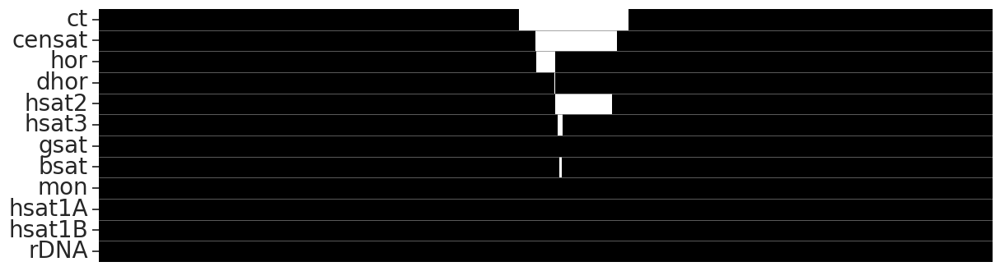

chr10


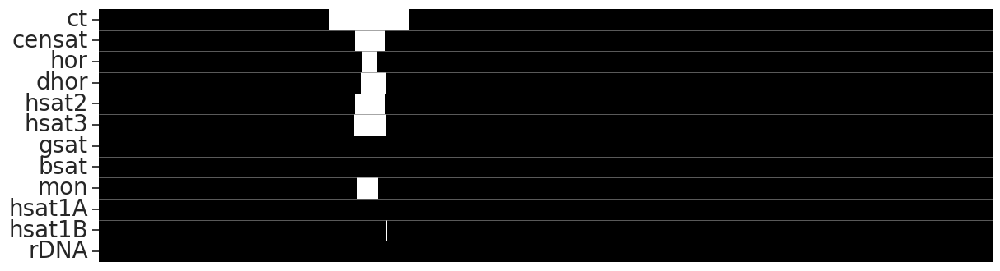

chr11


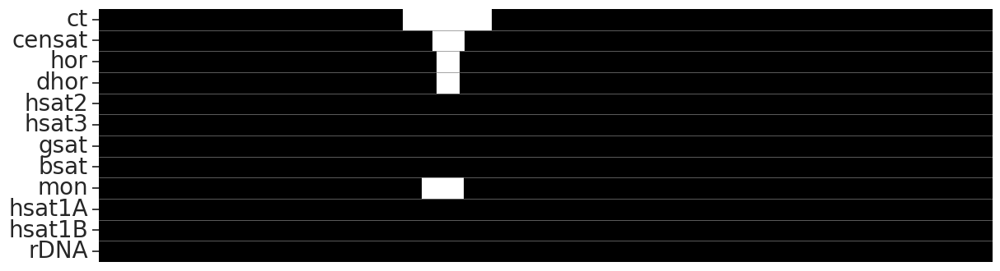

chr12


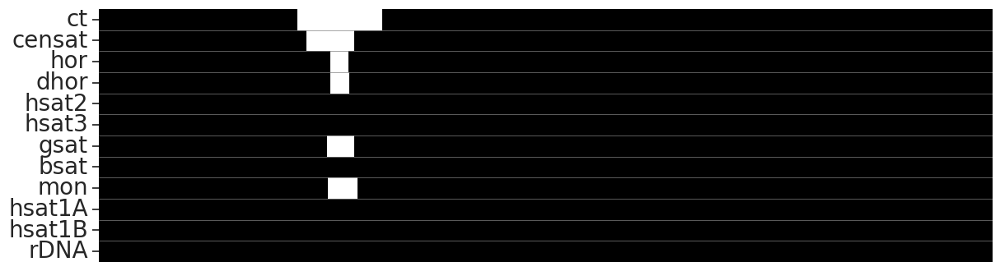

chr13


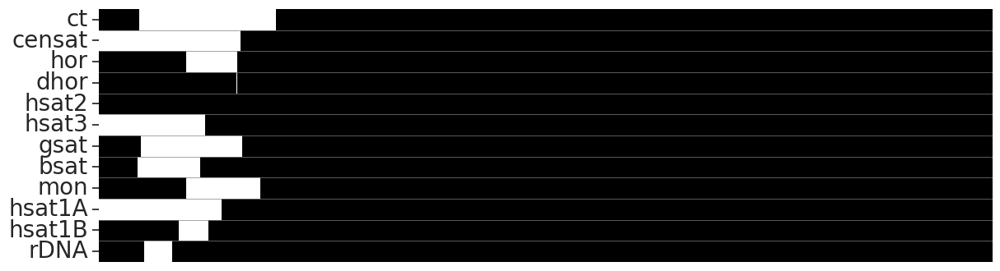

chr2


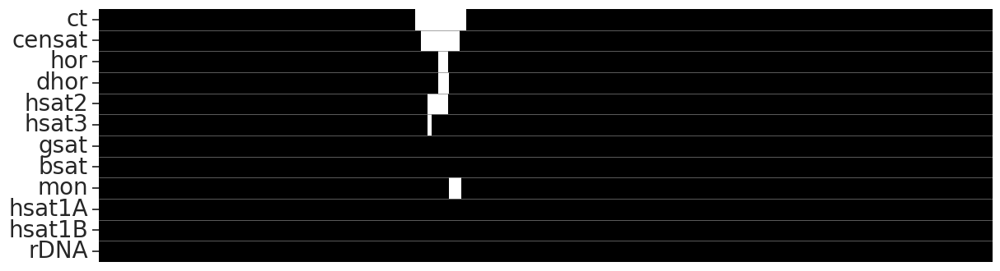

chr3


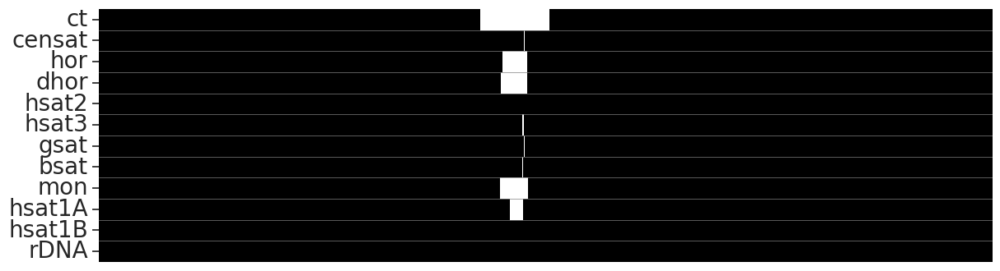

chr4


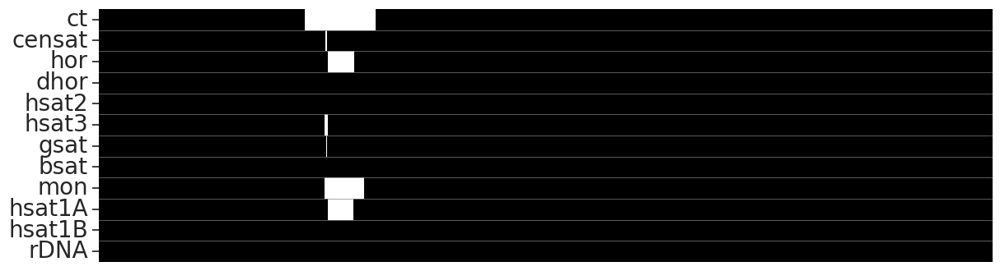

chr5


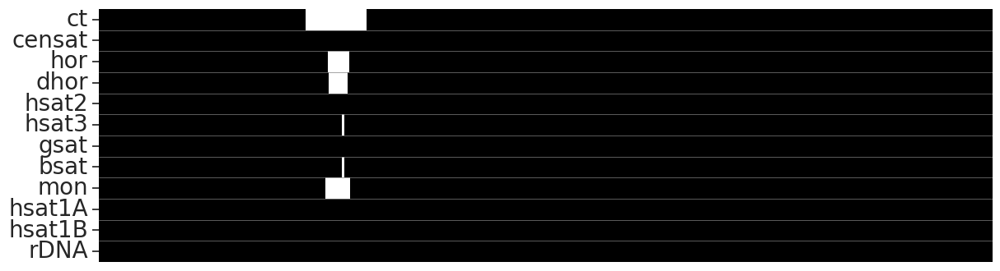

chr6


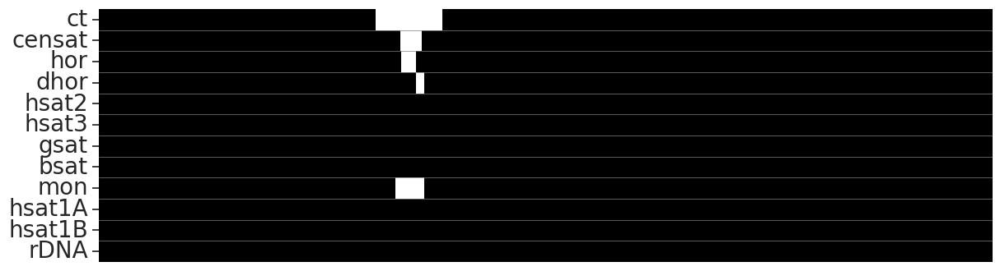

chr7


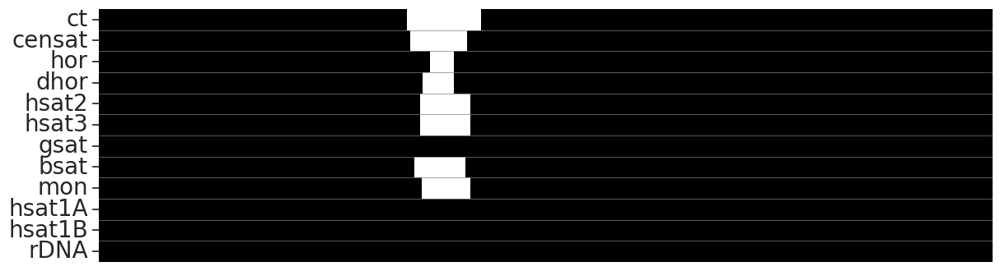

chr8


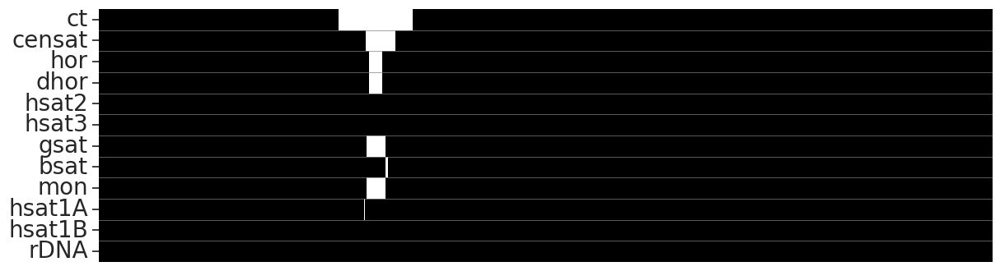

chr9


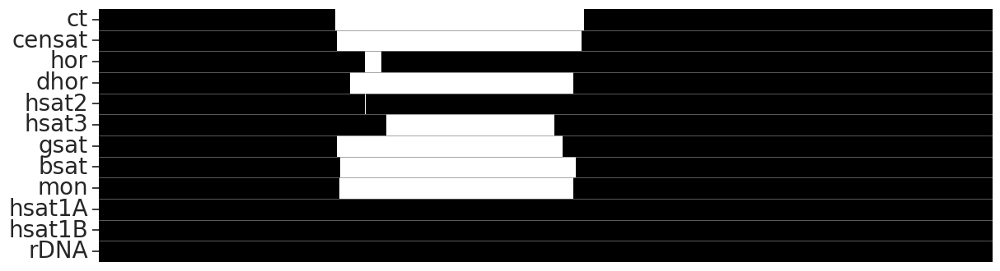

chr14


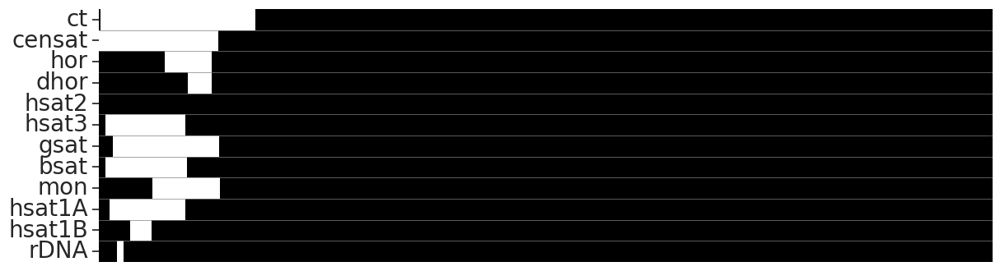

chr15


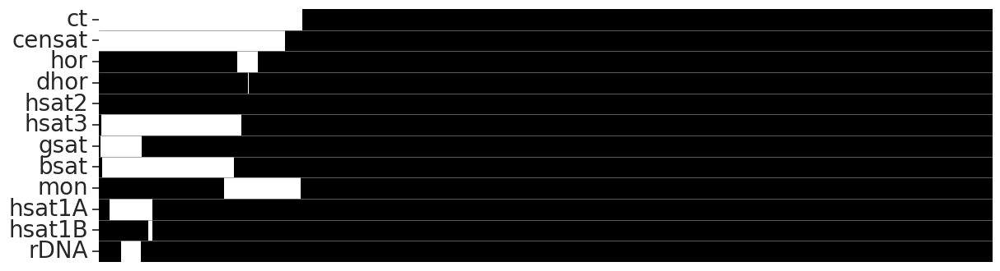

chr16


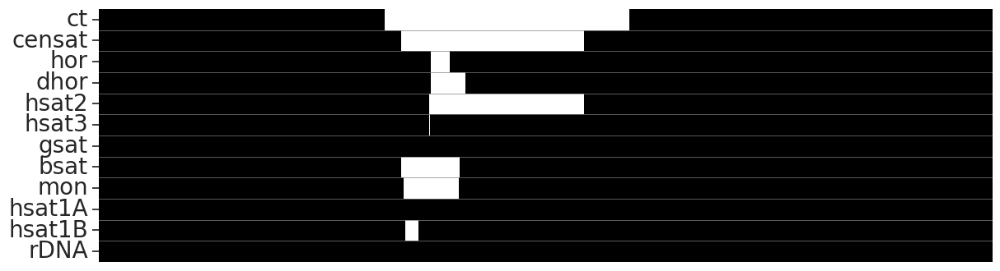

chr17


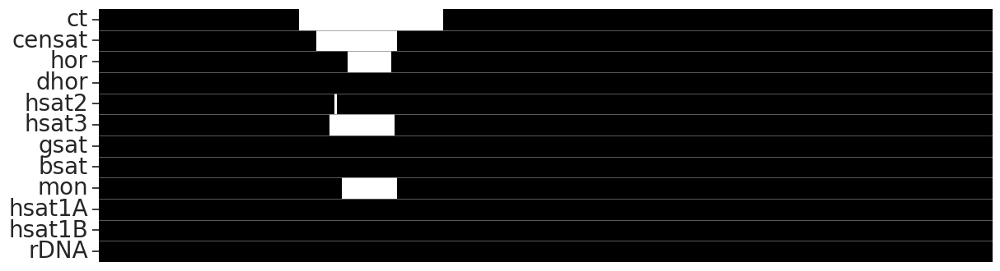

chr18


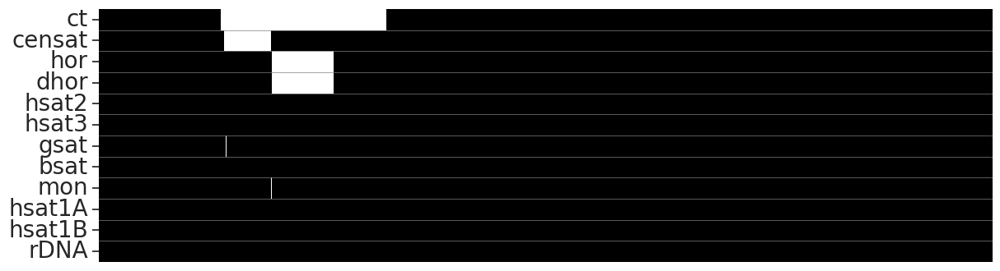

chr19


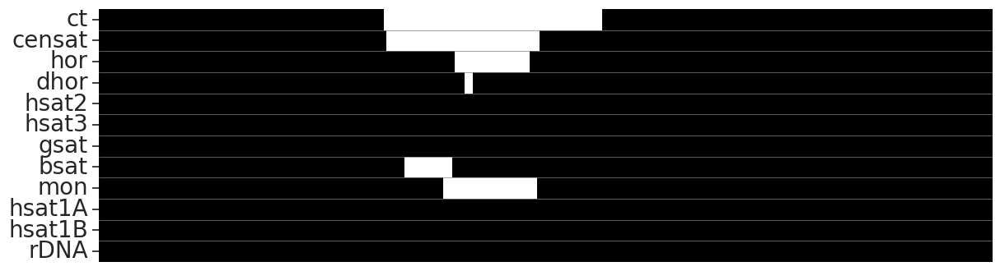

chr20


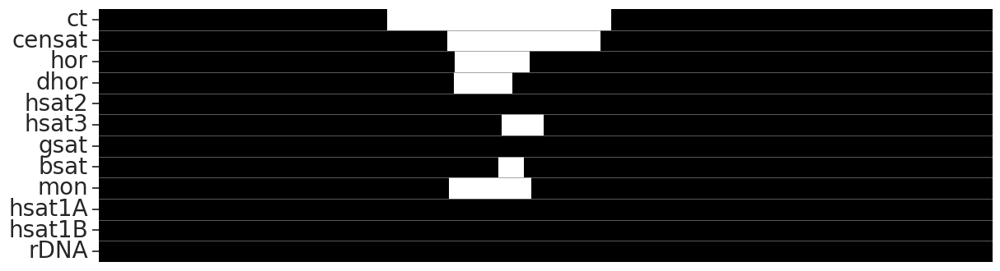

chr21


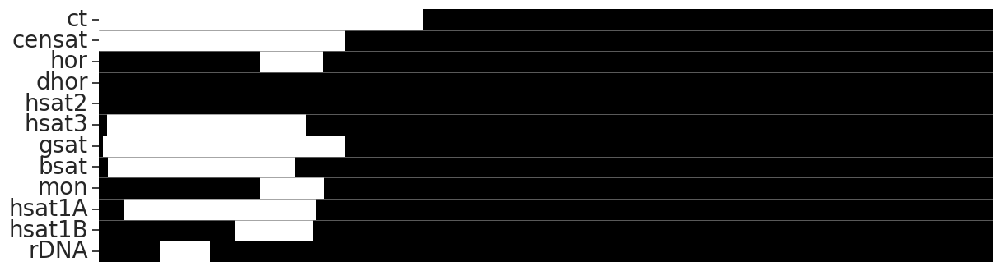

chr22


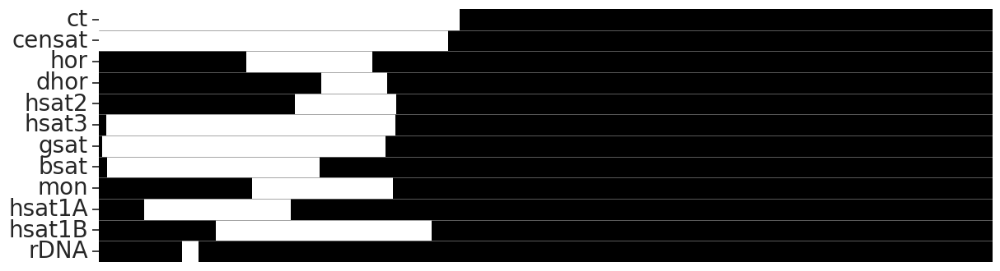

chrM


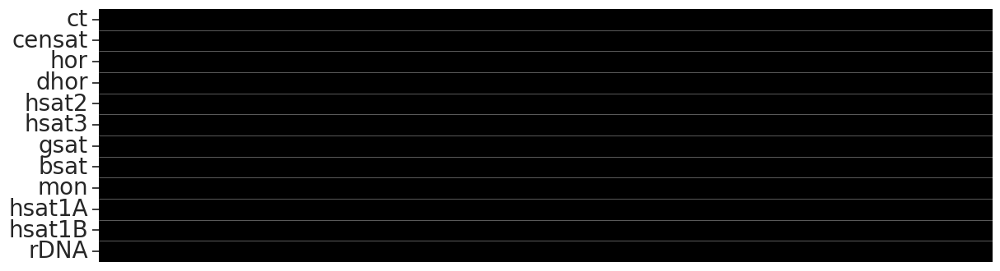

chrX


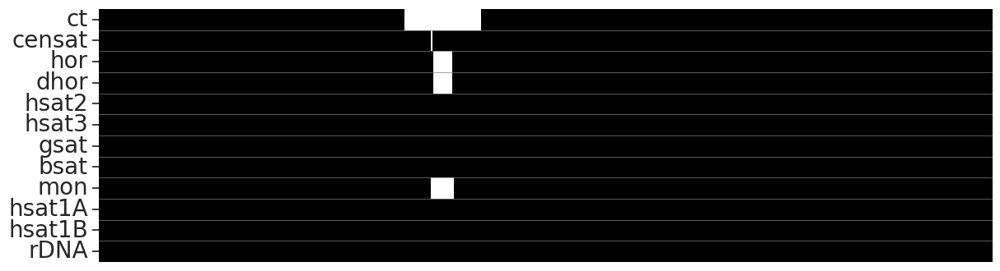

chrY


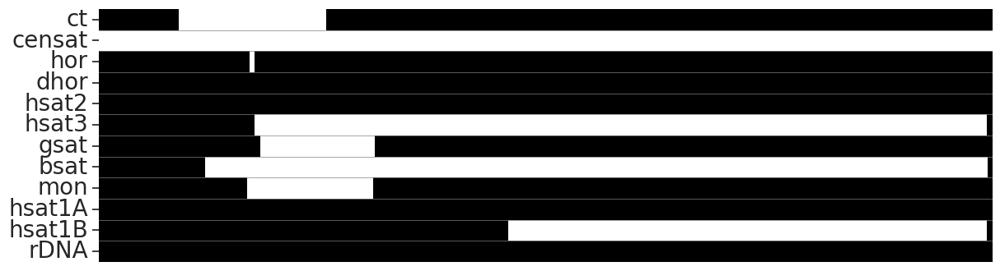

In [219]:
for chromosome in  bin_counts:
    print(chromosome)
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 4))
    
    cg= sns.heatmap(data=new_bins[chromosome].T,
                       cmap="gnuplot2",
                       # linewidth=1.0,
                        vmin=0.0,
                        vmax=1.0,
                       linecolor='black',
                    cbar=False,
                       ax=ax,
                    )
    
    ax.tick_params(axis="y", which="major", labelsize=20)
    ax.set_xticks([])

    for i in range(1, 12):
        ax.axhline(i, color='gray', alpha=1.0, lw=0.5, zorder=1)
    
    ax.set_xlabel("")
    ax.set_ylabel("")

    # cg.ax_cbar.set_ylabel("log10(Average STR Density per Mb)")
    # x0, _y0, _w, _h = cg.cbar_pos
    # cg.ax_cbar.set_position([x0, 0.3, 0.05, 0.3])
    
    # cg.ax_cbar.tick_params(axis='x', length=10)
    # for spine in cg.ax_cbar.spines:
        # g.ax_cbar.spines[spine].set_color('crimson')
    #    cg.ax_cbar.spines[spine].set_linewidth(2)
    fig = plt.gcf()
    fig.savefig(f"{density_path}/chromosome_heatmap_loci_homo_sapiens_{chromosome}.png", bbox_inches='tight')
    plt.show()
    plt.close()

In [197]:
ax.get_yticks()

array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
       11.5])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("white")
sns.set_theme(style = "ticks")
total_bins = 2000

str_df = tandem_human
str_df = str_df.merge(
                    chr_sizes,
                    on="chromosome",
                    how="left"
        ).dropna(subset=['chrLength'])


centromere_df = t2t_df.merge(chr_sizes,
                                      on="chromosome",
                                      how="left"
                                      )\
                                .dropna(subset=['chrLength'])

centromere_df['start'] = (1 + np.floor(centromere_df["start"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df['end'] = (1 + np.floor(centromere_df["end"] * total_bins / centromere_df["chrLength"])).astype(int)
centromere_df = centromere_df.set_index("chromosome").to_dict()

str_df["start"] = str_df["start"] - 1
str_df["end"] = str_df["end"] - 1

str_df['start_bin'] = (1 + np.floor(str_df["start"] * total_bins / str_df["chrLength"])).astype(int)
str_df['end_bin'] = (1 + np.floor(str_df["end"] * total_bins / str_df["chrLength"])).astype(int)

# str_df.to_csv(f"density/density_{species}.csv", sep="\t", index=False, mode="w")

chromosomes = str_df['chromosome'].unique()
bin_counts = {}
for chromo in chromosomes:
    bin_counts.update({chromo: {sru: np.zeros(2000) for sru in range(1, 10, 1)}})
    
temp = str_df.groupby(["chromosome", "start_bin", "end_bin", "sru"], as_index=False)\
                .agg(counts=("consensus", "count"))

In [ ]:
for _, row in tqdm(temp.iterrows(), total=temp.shape[0], leave=True, position=0):
    start = row["start_bin"]
    end = row["end_bin"]
    chromosome = row["chromosome"]
    counts = row["counts"]
    sru = int(row["sru"])
    
    for ii in range(start, end+1):
        bin_counts[chromosome][sru][ii-1] += counts

In [249]:
density_path

PosixPath('/storage/group/izg5139/default/external/satellites/scripts/density_human')

chr1


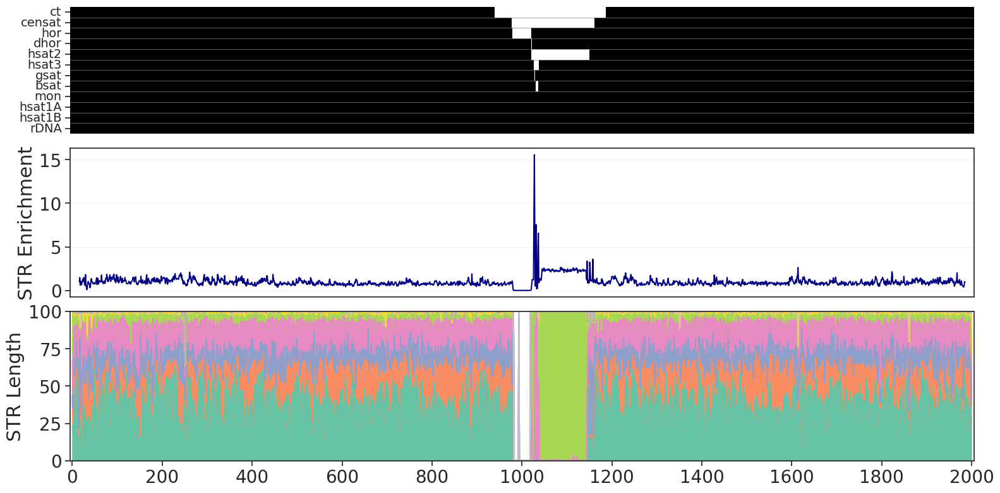

chr10


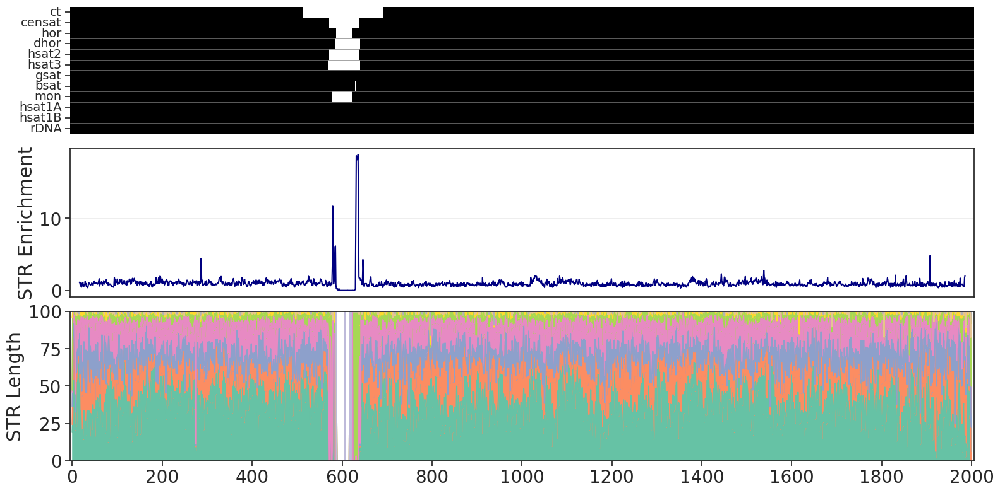

chr11


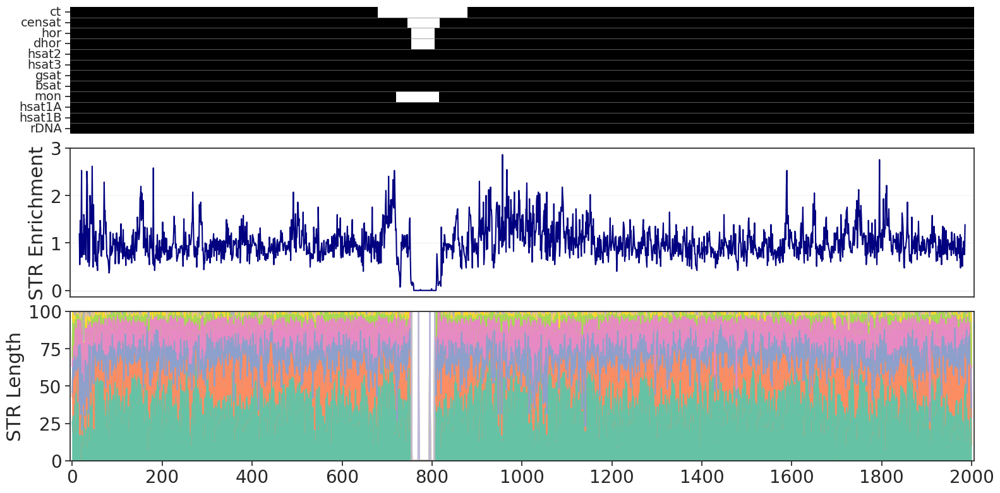

chr12


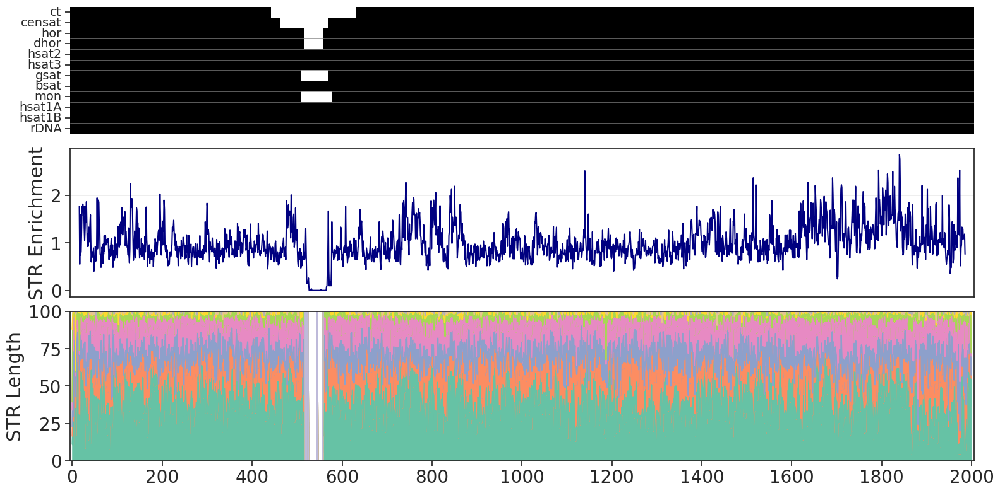

chr13


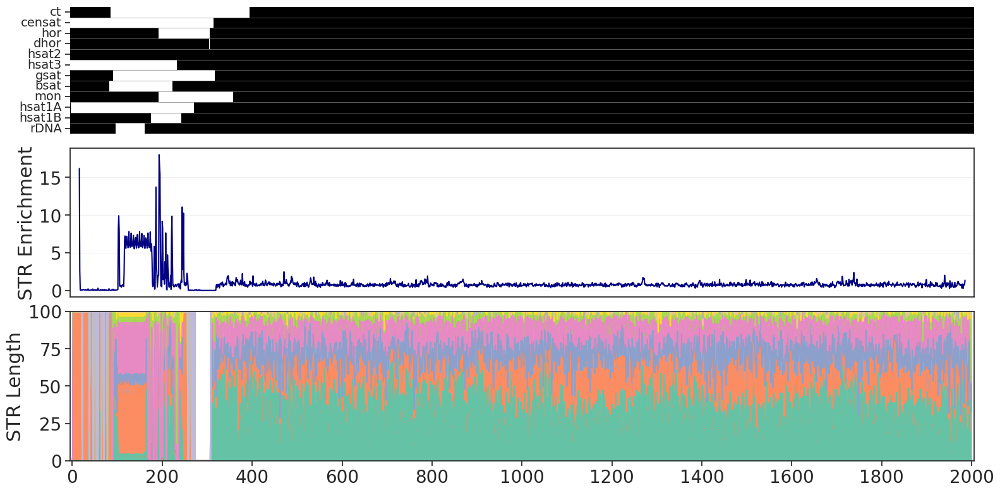

chr2


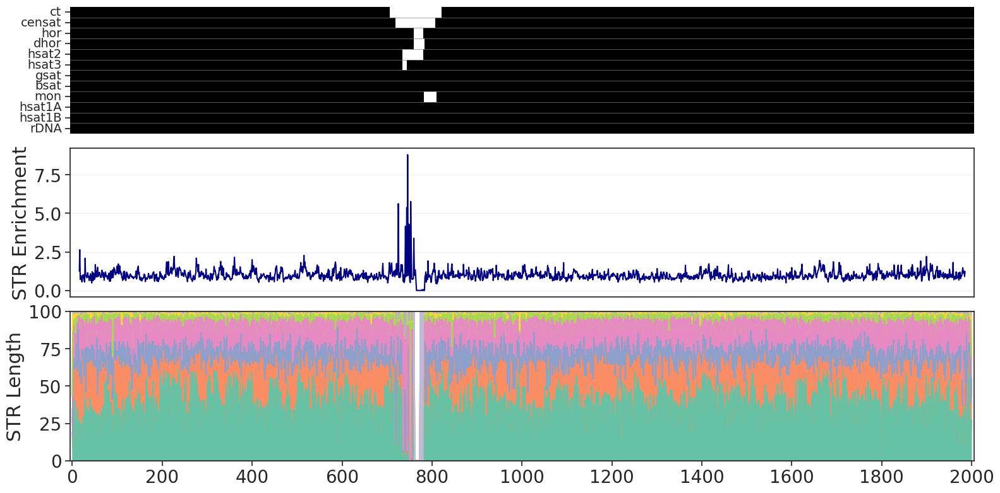

chr3


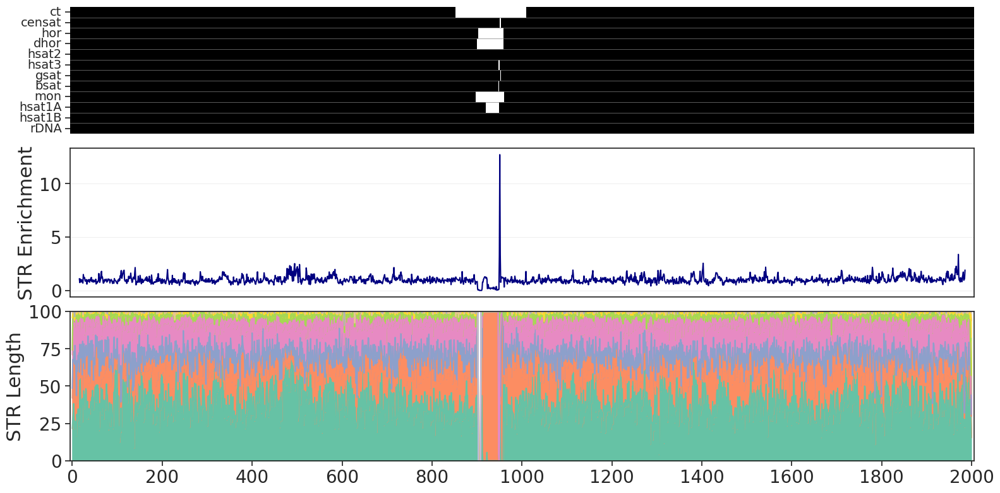

chr4


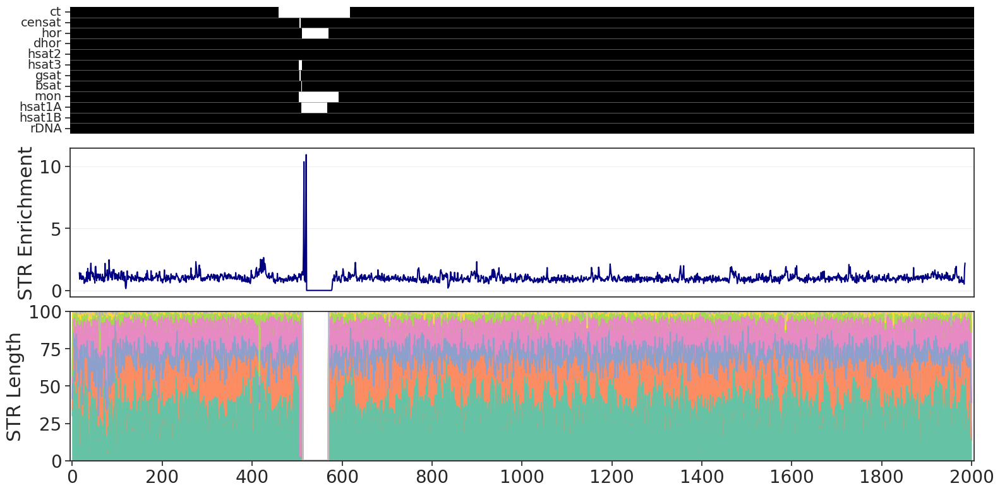

chr5


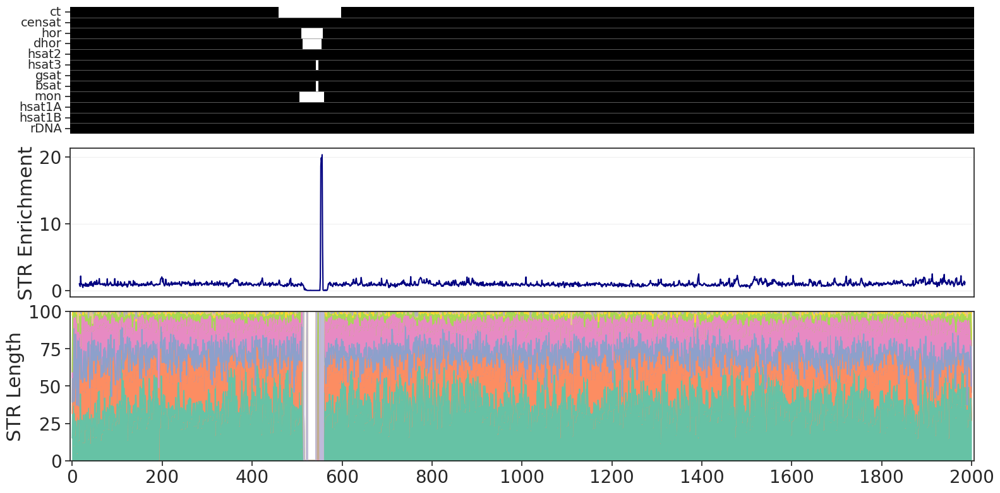

chr6


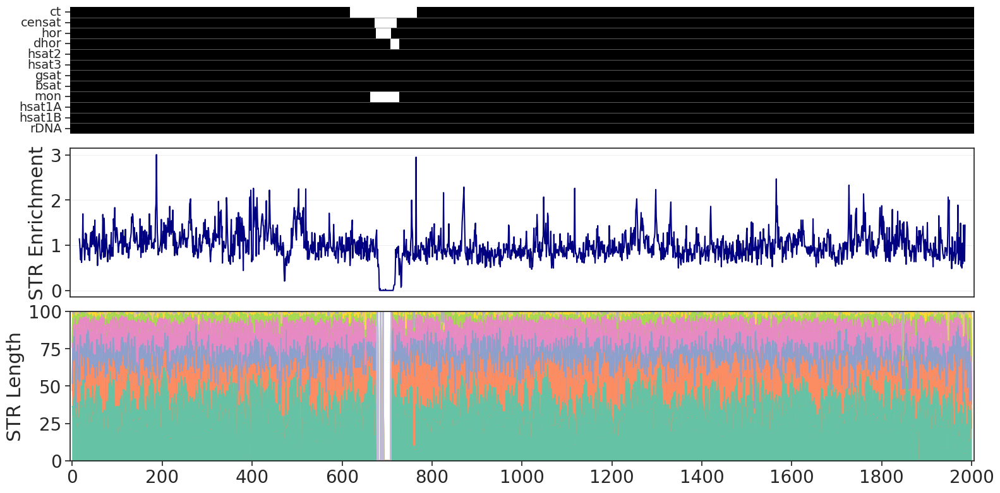

chr7


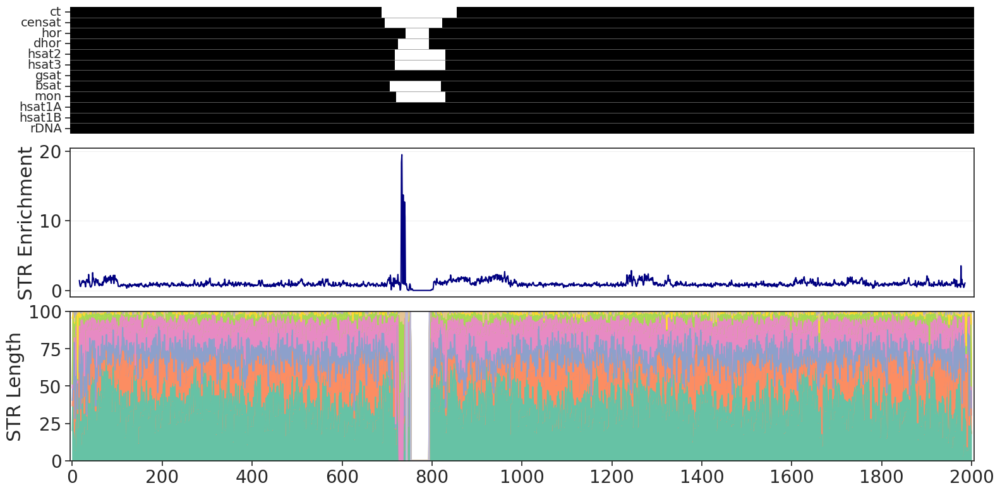

chr8


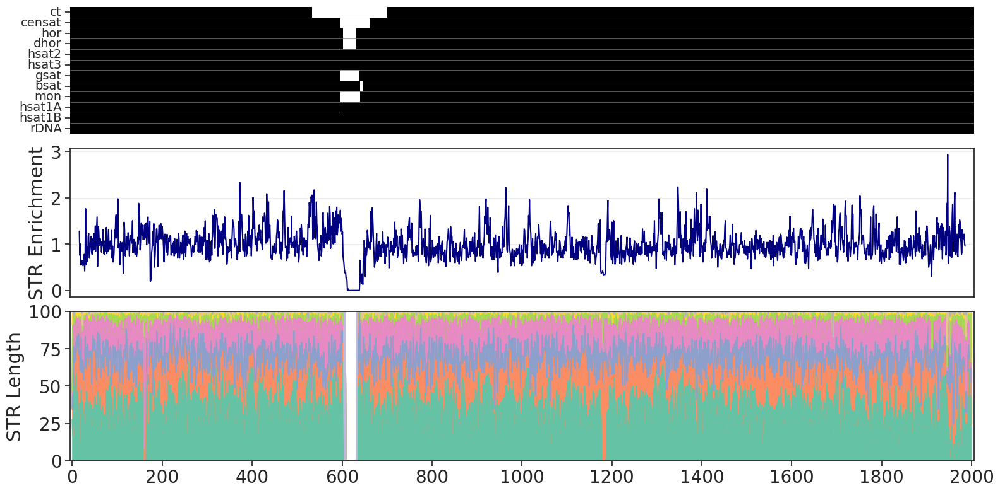

chr9


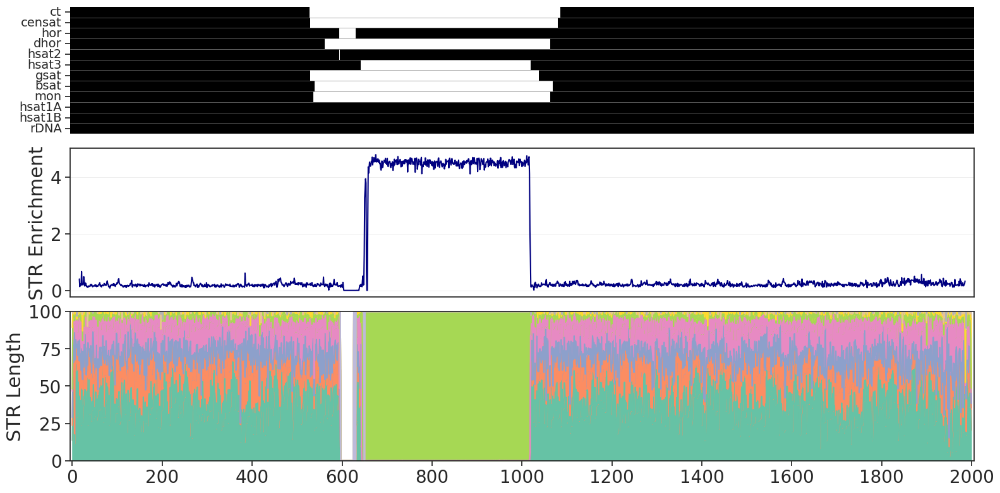

chr14


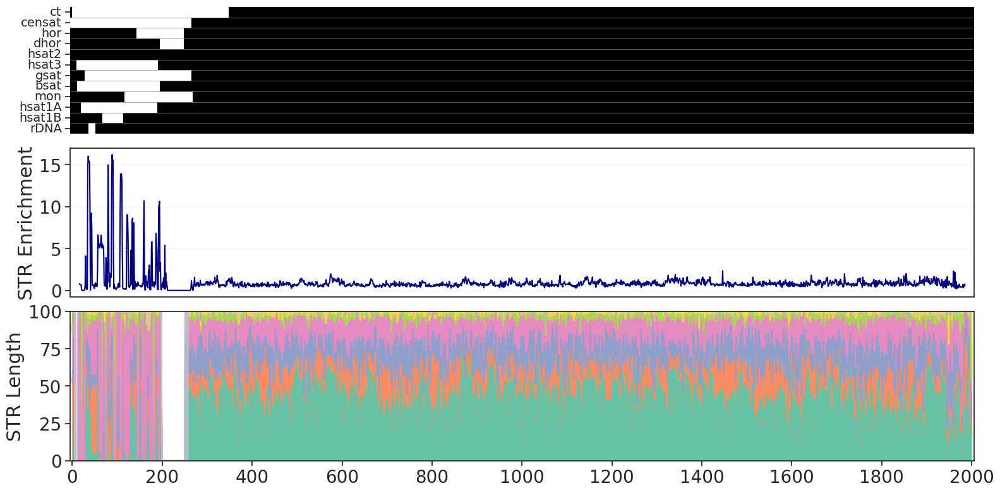

chr15


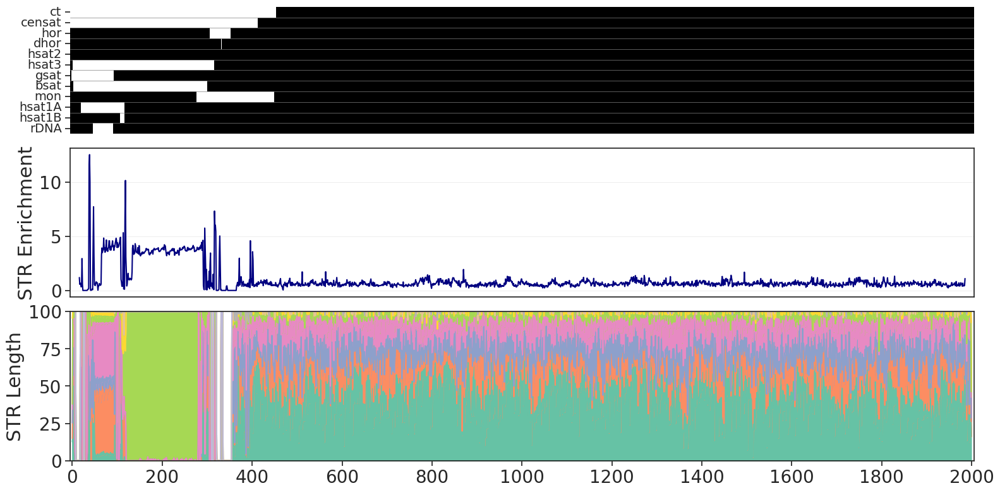

chr16


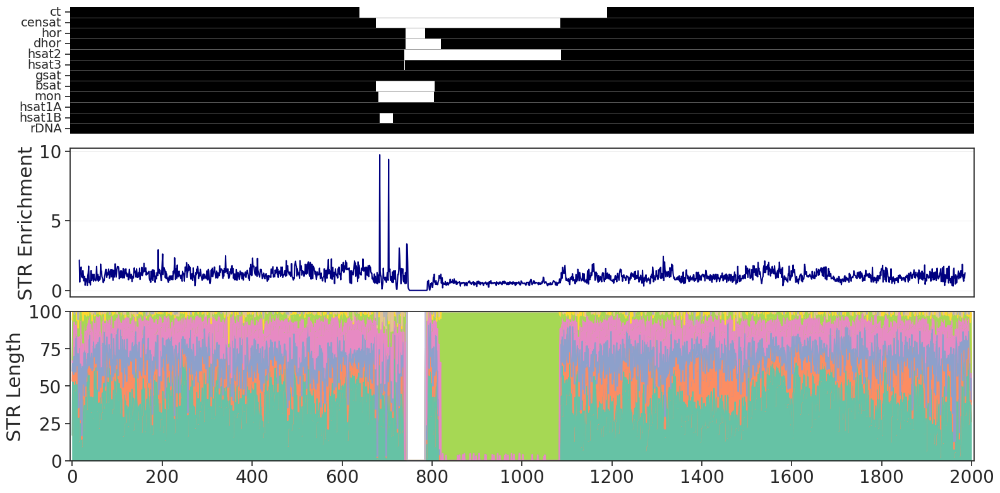

chr17


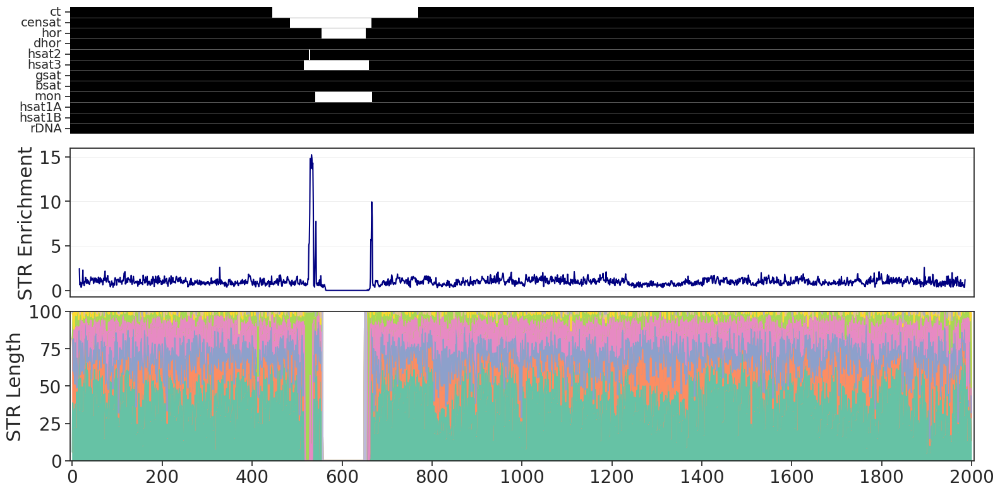

chr18


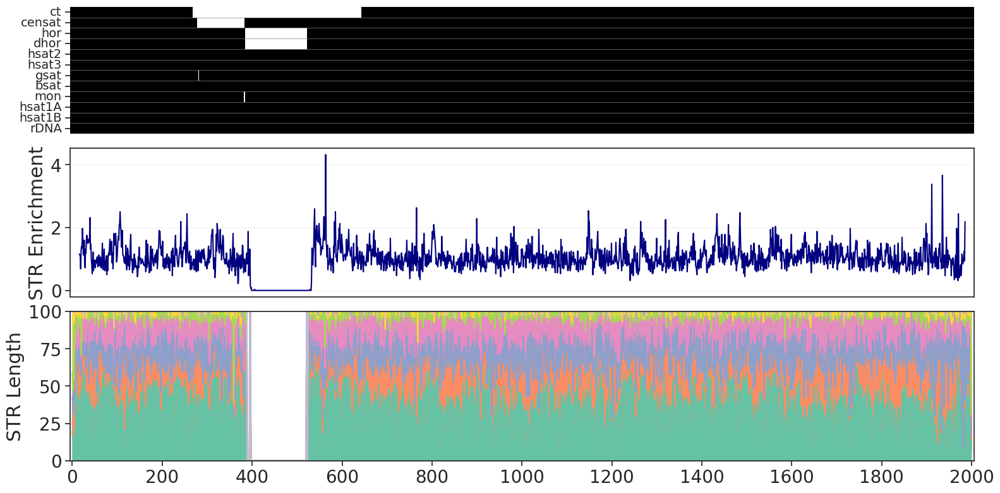

chr19


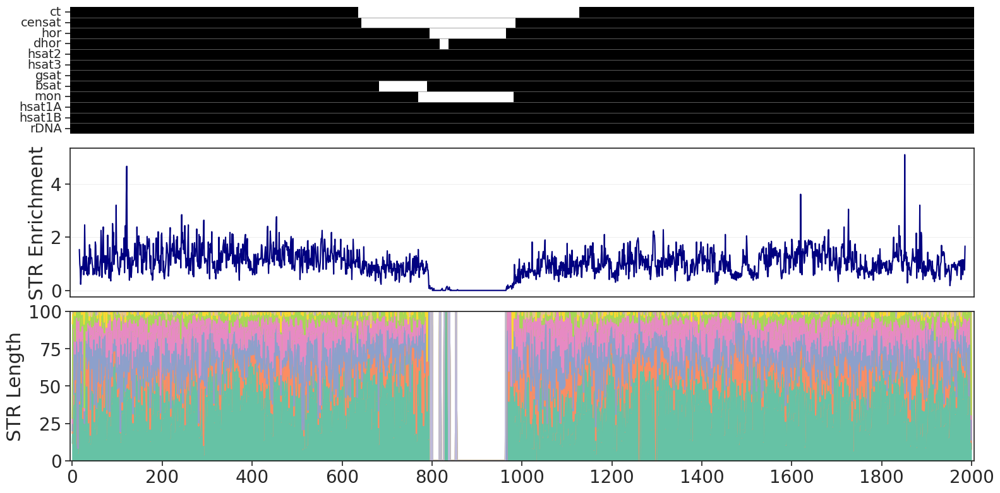

chr20


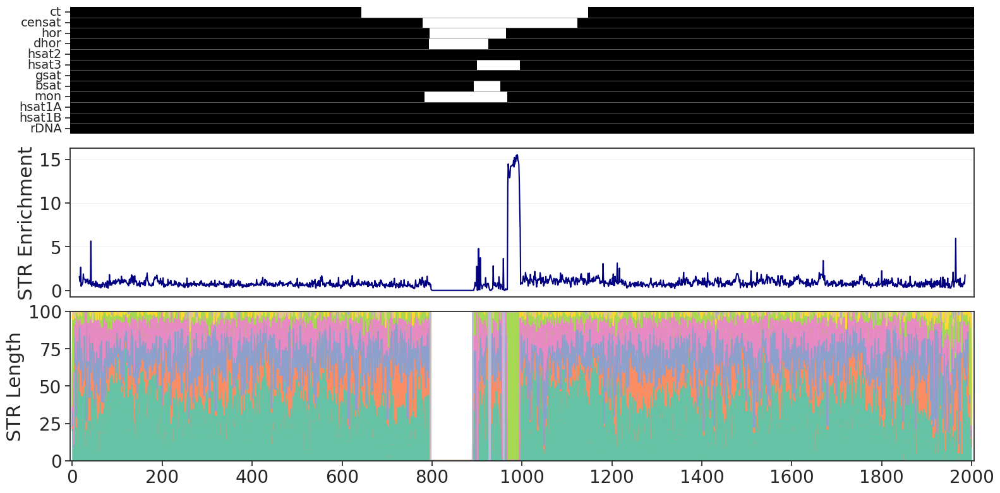

chr21


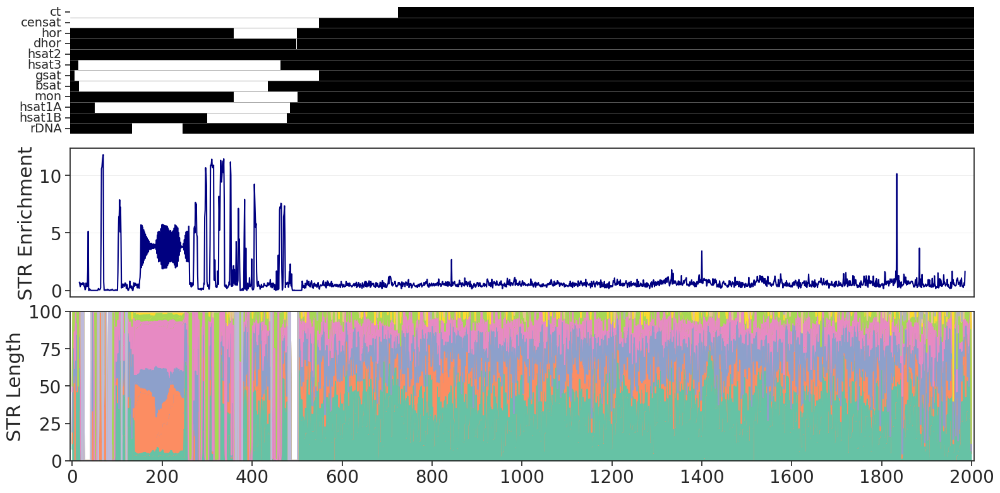

chr22


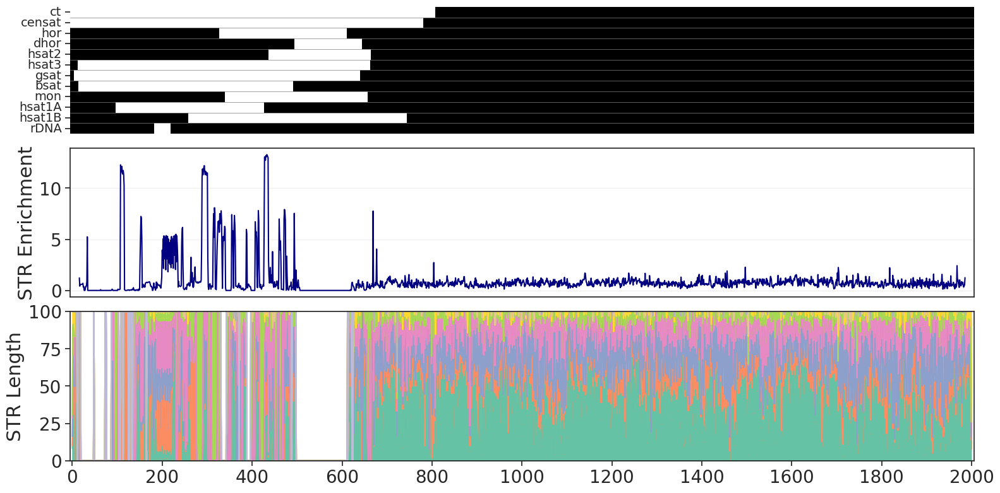

chrM


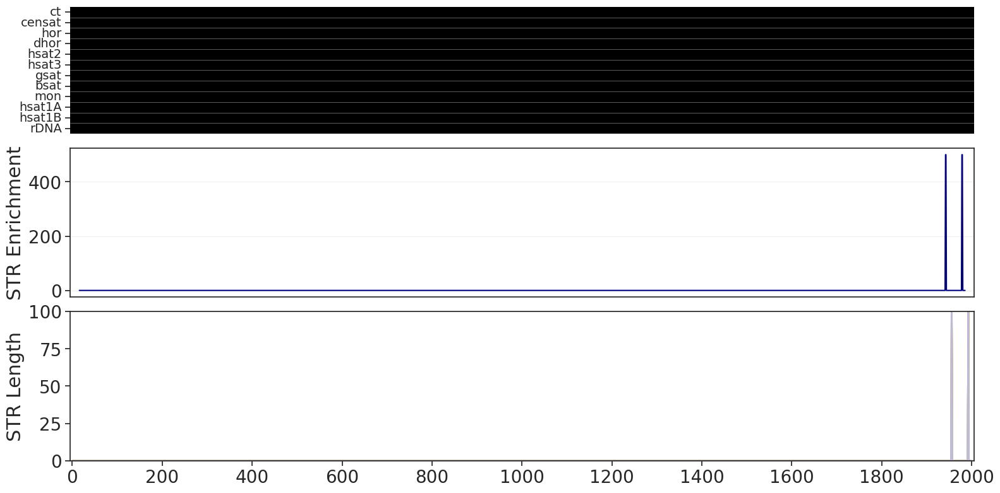

chrX


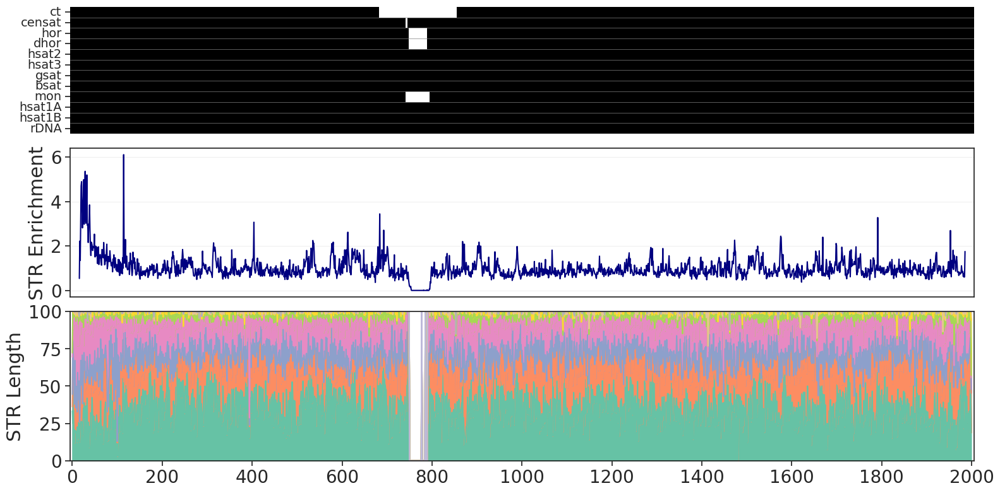

chrY


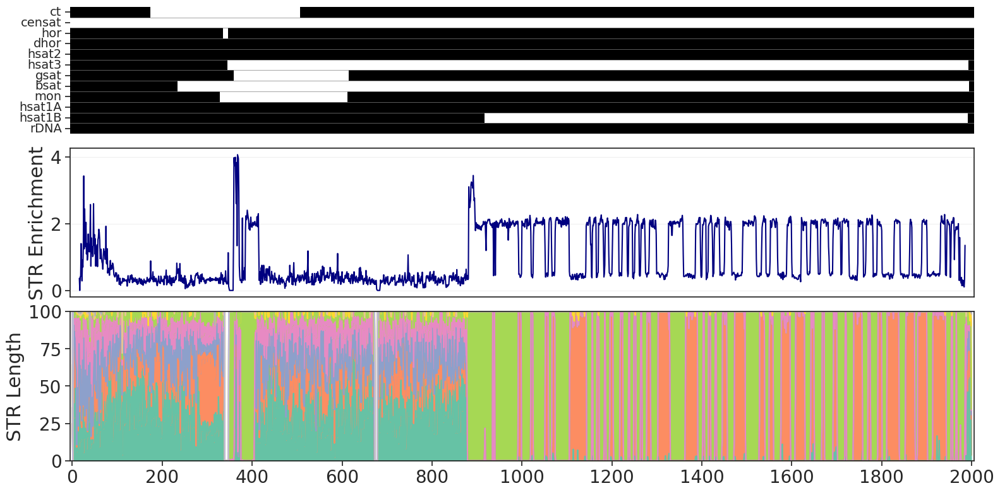

In [248]:
# for chromosome in bin_counts.keys():
#    pd.DataFrame(bin_counts[chromosome]).to_csv(f"bin_counts/{species}_{chromosome}_bin_counts.txt", sep="\t")

for chromosome in bin_counts:
    print(chromosome)
    fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(16, 8), height_ratios=[1.7, 2, 2])
    t = pd.DataFrame(bin_counts[chromosome]).T
    u = t.sum(axis=0) #/average
    average = u.mean()
    u = u /average

    if chromosome in centromere_df['start']:
        centro_start = centromere_df["start"][chromosome]
        centro_end = centromere_df["end"][chromosome]
    else:
        centro_start = centro_end = None

    t = 100 * (t/t.sum(axis=0))
    t.columns = [str(i) for i in t]
    t = t.T
        
    cg= sns.heatmap(data=new_bins[chromosome].T,
                       cmap="gnuplot2",
                       # linewidth=1.0,
                        vmin=0.0,
                    yticklabels=True,
                        vmax=1.0,
                       linecolor='black',
                    cbar=False,
                       ax=ax[0],
                    )
    
    ax[0].tick_params(axis="y", which="major", labelsize=14)
    ax[0].set_xticks([])

    for i in range(1, 12):
        ax[0].axhline(i, color='gray', alpha=1.0, lw=0.5, zorder=1)
    
    ax[0].set_xlabel("")
    ax[0].set_ylabel("")

    ax[1].plot(range(1, 2001), u.values, lw=1.5, color='navy')
    # if centro_start:
    #    ax[0].axvspan(centro_start, centro_end, color='#E8479F', alpha=0.3, zorder=4)

    ax[1].grid(lw=0.4, alpha=0.6, zorder=0)
    ax[1].set_ylabel("STR Enrichment")
    ax[1].set_xticks([])

    t.plot.area(color=color_palette, ax=ax[2])
    # ax[1].axvline(start, color='black', lw=3.0, zorder=4)
    # ax.axvspan(start, end, color='gray', alpha=0.3, zorder=4)
    ax[2].set_ylabel("STR Length")
    ax[1].set_xlim(xmin=-20, xmax=2020)
    ax[2].set_xlim(xmin=-5, xmax=2005)
    ax[2].set_xticks(range(0, 2200, 200))
    ax[2].xaxis.set_ticklabels(range(0, 2200, 200))
    for i in range(1, 3):
        ax[i].tick_params(axis="y", which="major", labelsize=20)
        ax[i].yaxis.label.set_size(22)
        ax[i].tick_params(axis="y", which='major', labelsize=20)

    ax[2].legend(handles=[], frameon=False)

    ax[2].tick_params(axis="x", which='major', labelsize=20)
    ax[2].set_ylim(0.0, 100.0)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.1)
    fig.savefig(f"{density_path}/homo_sapiens_{chromosome}_density.png", bbox_inches="tight")
    fig.savefig(f"{density_path}/homo_sapiens_{chromosome}_density.pdf", format="pdf", bbox_inches="tight")
    plt.show()
    plt.close()